# OPER 685 - Final Project

### Authors: 2d Lt Joseph Olson and Capt Guadalupe Hernandez

This analysis focuses on the following research questions (RQs).

- $\textbf{RQ1: Can player technical attributes predict a player's broad playing position (DEF/MID/FWD/GK)?}$

  - This question establishes the foundational structure of the dataset and seeks to determine whether measurable skill attributes naturally align with tactical roles in football.
  - There are also many practical and strategic reasons for predicting a player's broad playing position beyond just understanding the data structure.
  
    First, it helps game analysts understand how skill profiles correspond to tactical roles. This can inform player selection and formation strategies. For example, optimizing lineups to exploit strengths and minimize weaknesses.

    Second, it can improve scouting and player development in esports or competitive simulations. Knowing which attributes naturally align with positions allows analysts to identify players who may be undervalued in a particular role, or to train players to develop skills that suit their optimal positions.

    Finally, the insights obtained from this research question can enhance predictive models for player performance, market value, or even in game behavior. By understanding the link between technical attributes and positions, game designers can create algorithms that simulate realistic team dynamics.

    Overall, the answer to this question has tangible uses in team management, talent evaluation, and strategic decision making in competitive gaming environments.

  - Addressing this question also provides a necessary springboard for any subsequent analyses on player quality.

  - The analysis will require the use of dimension reduction techniques, such as principal component analysis or linear discriminant analysis, to make the data more tractable for subsequent classification methods.

  - Supervised classification methods, including Naïve Bayes, multinomial logistic regression (softmax regression), and k-nearest neighbors, will be employed.

  - $\textbf{Because we will be comparing multiple models, we will implement a 10 fold cross validation process to have an unbiased evaluation of model performance.}$

- $\textbf{RQ2: Can player skill attributes accurately classify players into FIFA rating tiers, and which attributes are most influential?}$

  - This research question shifts the focus from player position to player quality. Rather than asking where a player fits tactically, we now ask whether a player's measurable technical attributes can meaningfully distinguish between low, mid, and high tier performers. In doing so, this analysis evaluates the extent to which overall FIFA ratings are systematically determined by observable skill statistics.

  - A multinomial logistic regression model is used for this section of the analysis, modeling the probability that a player belongs to each quality tier based on their attributes.

  - Model performance is evaluated using accuracy, precision, recall, F1-scores, and confusion matrices to assess both overall predictive strength and patterns of misclassification.

$\textbf{The following research question will be addressed only if time permits.}$

- $\textbf{RQ3: Can player market value be classified using technical attributes, and does including predicted player quality improve performance?}$

  - This question shifts the focus to economic outcomes and examines whether market value is primarily determined by measurable attributes or by broader notions of player quality.

  - Market value would need to be discretized into low, medium, and high tiers.
  
  - A model comparison approach would need to be used, where one model uses only technical attributes and a second model incorporates predicted FIFA rating tiers from RQ2.

  - Comparing these models will reveal whether inferred player quality adds explanatory power and clarify the extent to which market value reflects skills, perceived quality, or both.


Overall, the research questions are sequentially connected. RQ1 establishes the underlying structure of players based on technical attributes, RQ2 leverages this information to assess player quality, and RQ3 (time permitting) uses the predicted quality to evaluate the economic implications of player performance.

## Import Libraries

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import math
import scipy.stats as stats
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OrdinalEncoder
from sklearn.naive_bayes import CategoricalNB
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import KBinsDiscretizer
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor
from sklearn.metrics import classification_report, mean_squared_error, r2_score
from sklearn.model_selection import KFold
from sklearn.model_selection import StratifiedKFold, GridSearchCV, cross_val_score
from sklearn.linear_model import LinearRegression
from numpy import mean
from numpy import absolute
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.linear_model import LogisticRegression
from scipy.spatial.distance import cdist
from imblearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier

Set a seed for reproducibility.

In [ ]:
np.random.seed(42)

## The Dataset

Use the following to mount your Google Drive. This gives you access to the `OPER 685` Google Folder I shared with you. This folder contains the dataset in csv format.

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


The following code sets the working directory to the `OPER 685` folder.

In [ ]:
import os
os.chdir('/content/gdrive/MyDrive/OPER 685')

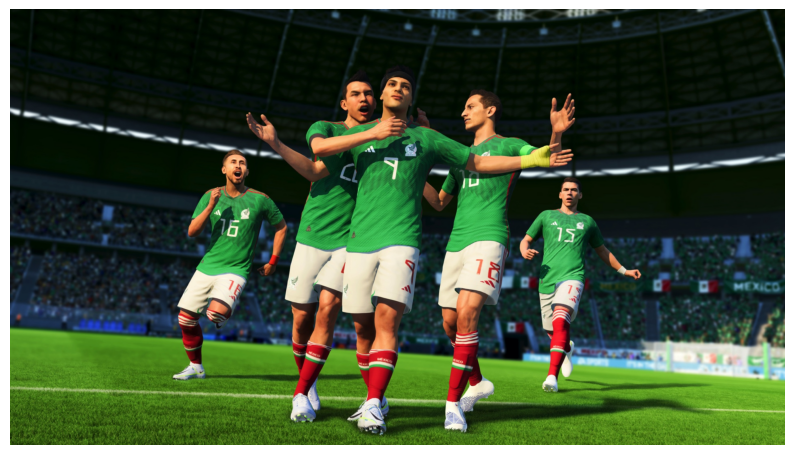

In [ ]:
img = mpimg.imread("FIFA.jpg")

# Display the image
plt.figure(figsize = (10, 8))
plt.imshow(img)
plt.axis('off')
plt.show()

The dataset selected for this project is the FIFA Football Players dataset. This dataset contains detailed information on 17,954 real-world professional soccer players (before pre-processing), scraped from the website [SoFIFA.com](https://sofifa.com/). SoFIFA is an online database for the EA Sports Football Club (formerly FIFA) video game series. The site allows gamers and analysts to browse player ratings, statistics, and expert evaluations.

The EA Sports FIFA video games are a global commercial product. They generate billions in revenue worldwide through video game sales, in-game purchases, and competitive online modes like FIFA Ultimate Team (FUT). (Source: https://www.cbr.com/fifa-ea-ultimate-team-microtransactions/). In FUT, competitive gamers and teams often build their squads by purchasing a substantial number of player packs. (Source: https://www.teamgullit.com/ea-fc-26/best-packs and https://www.gq.com.au/culture/entertainment/a-new-survey-has-revealed-the-insane-cost-people-are-going-to-to-get-good-at-fifa/news-story/31ea349aede3c3709771bc95a82f29ee). These packs contain a random selection of virtual player cards, each representing a real-world soccer player with specific skill attributes. The FIFA video game ecosystem also includes organized esports competitions, such as the FIFAe World Cup, where professional gamers and teams compete for prize money and sponsorship opportunities. (Source: https://e-football.konami.net/fifae_world_cup/2025/en/). These competitions, together with in-game purchases, creates an environment where in-game player ratings and attributes carry real economic relevance.

However, it is important to clarify that this dataset does not include monetary information related to gamer spending, pack prices, tournament winnings, or esports earnings. Instead, it contains player specific economic variables such as market value in euros and weekly wage. These variables represent the simulated and real-world valuation of professional players rather than financial outcomes for gamers.

This context makes the SoFIFA dataset valuable for analysis. That is, it provides a structured representation of how player skills and ratings are quantified within a widely used soccer simulation system. While monetary competitions exist within the broader FIFA digital gaming framework, our analysis will focus specifically on relationships between player attributes, performance ratings, positions, and player valuation rather than direct financial outcomes from competitive gaming.

Each player entry includes demographic, physical, technical, and economic attributes. For a deatiled list of features see below. In all, there are 51 features.
- name: Name of the player.
- full_name: Full name of the player.
- birth_date: Date of birth of the player.
- age: Age of the player.
- height_cm: Player's height in centimeters.
- weight_kgs: Player's weight in kilograms.
- positions: Positions the player can play.
- nationality: Player's nationality.
- overall_rating: Overall rating of the player in FIFA.
- potential: Potential rating of the player in FIFA.
- value_euro: Market value of the player in euros.
- wage_euro: Weekly wage of the player in euros.
- preferred_foot: Player's preferred foot.
- international_reputation(1-5): International reputation rating from 1 to 5.
- weak_foot(1-5): Rating of the player's weaker foot from 1 to 5.
- skill_moves(1-5): Skill moves rating from 1 to 5.
- body_type: Player's body type.
- release_clause_euro: Release clause of the player in euros.
- national_team: National team of the player.
- national_rating: Rating in the national team.
- national_team_position: Position in the national team.
- national_jersey_number: Jersey number in the national team.
- crossing: Rating for crossing ability.
- finishing: Rating for finishing ability.
- heading_accuracy: Rating for heading accuracy.
- short_passing: Rating for short passing ability.
- volleys: Rating for volleys.
- dribbling: Rating for dribbling.
- curve: Rating for curve shots.
- freekick_accuracy: Rating for free kick accuracy.
- long_passing: Rating for long passing.
- ball_control: Rating for ball control.
- acceleration: Rating for acceleration.
- sprint_speed: Rating for sprint speed.
- agility: Rating for agility.
- reactions: Rating for reactions.
- balance: Rating for balance.
- shot_power: Rating for shot power.
- jumping: Rating for jumping.
- stamina: Rating for stamina.
- strength: Rating for strength.
- long_shots: Rating for long shots.
- aggression: Rating for aggression.
- interceptions: Rating for interceptions.
- positioning: Rating for positioning.
- vision: Rating for vision.
- penalties: Rating for penalties.
- composure: Rating for composure.
- marking: Rating for marking.
- standing_tackle: Rating for standing tackle.
- sliding_tackle: Rating for sliding tackle.

## Data Wrangling

The data wrangling process below focuses on 4 primary goals:
1. handling missing data,
2. cleaning and transforming variables into machine learning ready formats,
3. selecting relevant features (feature extraction), and
4. standardizing features for use in algorithms sensitive to scale.

Please note that these steps are not strictly sequential. That is, throughout the data wrangling process we often apply multiple techniques simultaneously to prepare and refine the dataset.

In [ ]:
# Load data
fifa = pd.read_csv("fifa_players.csv")
fifa.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17954 entries, 0 to 17953
Data columns (total 51 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   name                           17954 non-null  object 
 1   full_name                      17954 non-null  object 
 2   birth_date                     17954 non-null  object 
 3   age                            17954 non-null  int64  
 4   height_cm                      17954 non-null  float64
 5   weight_kgs                     17954 non-null  float64
 6   positions                      17954 non-null  object 
 7   nationality                    17954 non-null  object 
 8   overall_rating                 17954 non-null  int64  
 9   potential                      17954 non-null  int64  
 10  value_euro                     17699 non-null  float64
 11  wage_euro                      17708 non-null  float64
 12  preferred_foot                 17954 non-null 

In [ ]:
fifa.head(10)

,name,full_name,birth_date,age,height_cm,weight_kgs,positions,nationality,overall_rating,potential,...,long_shots,aggression,interceptions,positioning,vision,penalties,composure,marking,standing_tackle,sliding_tackle
0,L. Messi,Lionel Andrés Messi Cuccittini,6/24/1987,31,170.18,72.1,"CF,RW,ST",Argentina,94,94,...,94,48,22,94,94,75,96,33,28,26
1,C. Eriksen,Christian Dannemann Eriksen,2/14/1992,27,154.94,76.2,"CAM,RM,CM",Denmark,88,89,...,89,46,56,84,91,67,88,59,57,22
2,P. Pogba,Paul Pogba,3/15/1993,25,190.50,83.9,"CM,CAM",France,88,91,...,82,78,64,82,88,82,87,63,67,67
3,L. Insigne,Lorenzo Insigne,6/4/1991,27,162.56,59.0,"LW,ST",Italy,88,88,...,84,34,26,83,87,61,83,51,24,22
4,K. Koulibaly,Kalidou Koulibaly,6/20/1991,27,187.96,88.9,CB,Senegal,88,91,...,15,87,88,24,49,33,80,91,88,87
5,V. van Dijk,Virgil van Dijk,7/8/1991,27,193.04,92.1,CB,Netherlands,88,90,...,64,82,88,41,60,62,87,90,89,84
6,K. Mbappé,Kylian Mbappé,12/20/1998,20,152.40,73.0,"RW,ST,RM",France,88,95,...,78,62,38,88,82,70,86,34,34,32
7,S. Agüero,Sergio Leonel Agüero del Castillo,6/2/1988,30,172.72,69.9,ST,Argentina,89,89,...,83,65,24,92,83,83,90,30,20,12
8,M. Neuer,Manuel Neuer,3/27/1986,32,193.04,92.1,GK,Germany,89,89,...,16,29,30,12,70,47,70,17,10,11
9,E. Cavani,Edinson Roberto Cavani Gómez,2/14/1987,32,185.42,77.1,ST,Uruguay,89,89,...,79,84,48,93,77,85,82,52,45,39


After loading the data, we observe that the dataset contains 17,954 rows and 51 columns. The features consist of a mix of continuous and categorical variables. This is prior to any data preprocessing or feature selection.

Below we check for missing values.

In [ ]:
missing_summary = fifa.isnull().sum().sort_values()
print(missing_summary[missing_summary > 0])

wage_euro                   246
value_euro                  255
release_clause_euro        1837
national_team_position    17097
national_rating           17097
national_team             17097
national_jersey_number    17097
dtype: int64


Some features in the dataset contain missing values. Specifically, the following columns have incomplete samples:
- value_euro,
- wage_euro,
- release_clause_euro,
- national_team,
- national_rating,
- national_team_position, and
- national_jersey_number.

Some of these missing entires are easily explained. For instance, the national team-related fields are only populated for players who are currently selected for licensed national squads in EA Sports games. Players who belong to unlicensed national teams may still appear in the game if they play for a licensed club team, but their national team fields remain empty in the game files. Additionally, licensing restrictions prevent certain national teams from appearing fully in the game. Some teams may be entirely absent or appear with generic avatars. Overall, the missing values we observe for these national team-related fields refelcts a structural missingness inherit in the environment of video game design and licensing practices. The missingness of the data is not a quality issue. (Source: https://cyberpost.co/why-fifa-22-removed-national-teams/).

### Dropping the National Team Variables

This then raises the question of whether the national team-related fields should be retained for analysis. To address this, we first examine the proportion of missing values for these features.

In [ ]:
missing_national_pct = fifa['national_team'].isnull().mean() * 100
print("Percent of data missing national team label:", round(missing_national_pct, 4))

Percent of data missing national team label: 95.2267


In our dataset, over 95% of players are missing entires for national_team, national_rating, national_team_position, and national_jersey_number. Features with such a high level of missingness generally provide little useful information for modeling and may actually bias the results if imputed. Furthermore, since the missingness occurs because a player is not part of a licensed national team, standard imputation methods are inappropriate.

For predictive modeling tasks such as classifying player positions, FIFA rating tiers, or estimating market value, these national team-related features are unlikely to add meaningful predictive power. Given their structural missingness and the small subset of players with data, we will proceed with removing these features from the analysis. Note that here we are using domain specific knowledge to help us exclude certain features from the analysis.

Here, it is important to distinguish structural missingness from the concept of data that are not Missing Completely at Random (MCAR). Structural missingness arises because the variable is not applicable for a large subset of observations. Non-MCAR mechanisms describe statistical dependence between missingness and other variables. In this case, the missingness is deterministically tied to national team membership and is therefore not appropriate for standard imputation methods.

In [ ]:
national_cols = ['national_team',
                 'national_rating',
                 'national_team_position',
                 'national_jersey_number']

# Drop the columns
fifa_clean = fifa.drop(columns = national_cols)

fifa_clean.shape

(17954, 47)

### Dropping the Release Clause Variable

Even after removing the national team columns, the dataset still contains missing values for wage_euro, value_euro, and release_clause_euro.

In the SoFIFA player dataset, value_euro represents the estimated market value of the football player in Euros. Furthermore, wage_euro represents the weekly salary of a football player in Euros, and release_clause_euro represents the specific monetary amount that another club must pay to trigger an automatic transfer negotiation for a player.

Understanding these definitions is important when interpreting missing values. Not all players have a release clause included in their contracts. Therefore NULL values in this column are expected rather than erroneous. In some countries, such as Spain, release clauses are mandatory in professional contracts. In others, such as France, they are not legally permitted. (Source: https://m.allfootballapp.com/news/All/What-is-Kylian-Mbappe%E2%80%99s-release-clause--transfer-value/969731#:~:text=Kylian%20Mbappe%20does%20not%20have,to%20be%20included%20in%20contracts). Additionally, players who are free agents (meaning they are not currently under contract with a club) do not have release clauses. As a result, release_clause_euro is not a universal attribute across all players.

This also brings up another discussion point. Free agents or recently added young players might sometimes appear with missing economic values in the game files because no formal contract evaluation currently exists for them.

Given these structural differences, missingness in these economic variables may reflect league regulations or player status rather than data quality issues. Below, we examine the proportion of missing entries for these economic features to assess overall data completeness and determine how they should be handled in subsequent analysis.

In [ ]:
economic_features = ['wage_euro', 'value_euro', 'release_clause_euro']
missing_proportions = fifa_clean[economic_features].isnull().mean() * 100

print("Proportion of missing values for each economic feature (%):")
print(missing_proportions)

Proportion of missing values for each economic feature (%):
wage_euro               1.370168
value_euro              1.420296
release_clause_euro    10.231703
dtype: float64


Both wage_euro and value_euro have very low rates of missingness ($\approx 1.3 \text{ to } 1.4\%$). This means dropping the rows with missing values for these two features might be reasonable and unlikely to bias the analysis if the data is truly missing at random. In contrast, release_clause_euro has over 10% missing entries. Dropping incomplete cases for this feature would remove a substantial portion of the dataset and could introduce bias if the missingness is not random.

To better understand the missingness in the variable release_clause_euro, we now consider additional domain knowledge expertise. Empirical evidence from a University of Rochester study of FIFA/EA FC data supports the idea that many professional players legitimately do not have a defined release clause. (Source: https://hajim.rochester.edu/ece/sites/zduan/teaching/ece408/projects/2024/GuangzhouCai_HaotianYang_YichengShi_FinalProject_Report.pdf). This institutional difference suggests that missing values in this field may reflect contractual reality rather than data quality issues. According to this study, the distribution of release clauses is highly right-skewed. That is, there are only a relatively small number of extremely large clause values and many players without defined amounts. This pattern is consistent with structural missingness rather than a random data entry error. This result is also corroborated by our findings in the histogram below.

Since the feature release_clause_euro is not central to our research questions and its missingness is inherently structural rather than random, we will exclude it from the analysis. Our primary economic indicators, wage_euro and value_euro, already capture the relevant player market information for modeling purposes. Excluding release_clause_euro simplifies the dataset and avoids introducing unnecessary complications from handling its substantial missingness, without sacrificing predictive power for our study objectives.

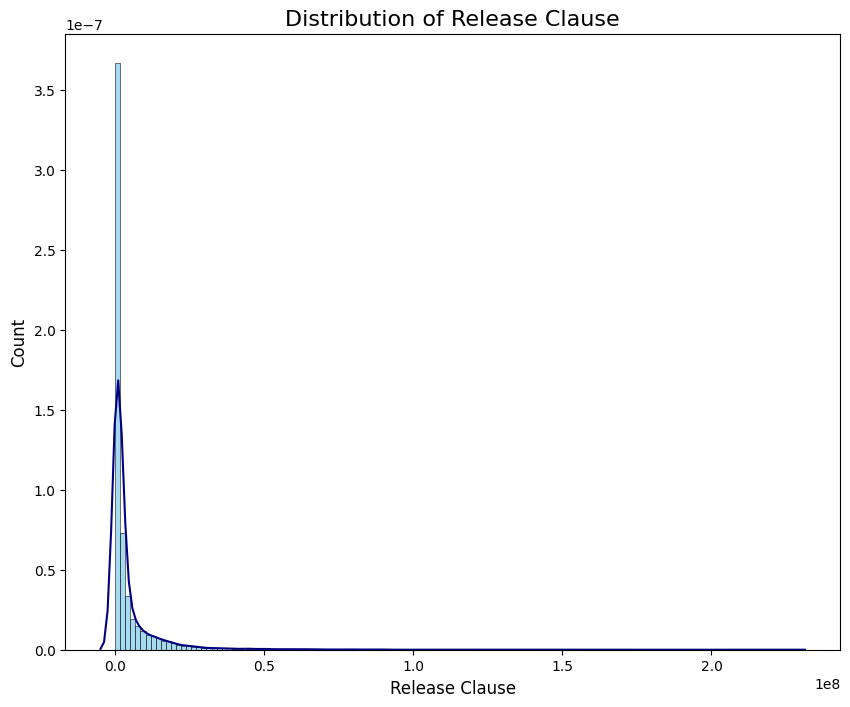

In [ ]:
# Square root Rule for # of bins
num_bins = int(np.sqrt(fifa_clean.shape[0]))

# Plot distribution of release_clause_euro
plt.figure(figsize = (10, 8))

sns.histplot(fifa_clean['release_clause_euro'],
             stat='density',
             bins = num_bins,
             color = 'skyblue',
             edgecolor = 'black')

# KDE overlay
sns.kdeplot(fifa_clean['release_clause_euro'],
            color = 'navy',
            linewidth = 1.5)

plt.title("Distribution of Release Clause", fontsize = 16)
plt.xlabel("Release Clause", fontsize = 12)
plt.ylabel("Count", fontsize = 12)

# Save
plt.savefig("images/release_clause_hist.png",
            dpi = 300,
            bbox_inches = 'tight')
plt.show()

Below we remove the release_clause_euro feature from the dataset.

In [ ]:
# Drop the release_clause_euro column
fifa_clean = fifa_clean.drop(columns = ['release_clause_euro'])

fifa_clean.shape

(17954, 46)

### Removing Incomplete Samples

Below, we examine the percentage of the dataset that is incomplete because either the value_euro or wage_euro entry is missing.

In [ ]:
# Compute percentage of rows with missing wage_euro OR missing value_euro
either_missing = fifa_clean['wage_euro'].isnull() | fifa_clean['value_euro'].isnull()
percent_either_missing = either_missing.mean() * 100

print("Percentage of rows with either wage_euro or value_euro missing:", percent_either_missing)

Percentage of rows with either wage_euro or value_euro missing: 1.4202963127993762


Because the amount of missing data for either wage_euro or value_euro is minimal (less than 1.5% of the dataset), we will remove the incomplete cases. While we know that the missingness might not be strictly random, the small proportion of missing values means that any potential bias introduced by dropping these rows is likely negligible. This approach is also unlikely to meaningfully alter the overall distribution of players across the economic variables.

Complete case analysis keeps the preprocessing pipeline simple and maintains interpretability, which is a priority for this study. Additionally, since wage_euro and value_euro are key economic variables in the analysis, restricting ourselves to complete observations avoids the need to make potentially strong assumptions required by imputation methods.

In [ ]:
# Drop rows with missing wage_euro or value_euro
fifa_clean = fifa_clean.dropna(subset = ['wage_euro', 'value_euro'])

fifa_clean.shape

(17699, 46)

One last check for missing values.

In [ ]:
missing_summary = fifa_clean.isnull().sum().sort_values()
print(missing_summary[missing_summary > 0])

Series([], dtype: int64)


There are no more missing entries in the dataset.

### Data Validation (Checking for Impossible Values)

After handling missing data, we now turn our focus to data validation. The goal is to identify impossible or inconsistent values in the dataset. For example, features with invalid skill ranges or unrealistic physical measurements could bias the analysis and should be corrected or removed before modeling.

Note that this data validation process often overlaps with feature selection. This occurs because we must make decisions about removing or correcting certain values that may influence which features are ultimately retained. We will approach this on a case-by-case basis, carefully evaluating each feature to maintain both data quality and model interpretability.

As an initial step, we examine summary statistics for each numeric feature. This provides a quick overview of variable ranges, central tendencies, and potential outliers, allowing us to identify values that may fall outside realistic or expected bounds before conducting more targeted validation checks.

In [ ]:
fifa_clean.describe().T

,count,mean,std,min,25%,50%,75%,max
age,17699.0,2.553353e+01,4.696970e+00,17.0,22.00,25.00,29.00,4.600000e+01
height_cm,17699.0,1.749304e+02,1.403618e+01,152.4,154.94,175.26,185.42,2.057400e+02
weight_kgs,17699.0,7.529023e+01,7.086058e+00,49.9,69.90,74.80,79.80,1.102000e+02
overall_rating,17699.0,6.622566e+01,6.974595e+00,47.0,62.00,66.00,71.00,9.400000e+01
potential,17699.0,7.144969e+01,6.134616e+00,50.0,67.00,71.00,75.00,9.500000e+01
value_euro,17699.0,2.479280e+06,5.687014e+06,10000.0,325000.00,700000.00,2100000.00,1.105000e+08
wage_euro,17699.0,9.905192e+03,2.200046e+04,1000.0,1000.00,3000.00,9000.00,5.650000e+05
international_reputation(1-5),17699.0,1.111984e+00,3.930438e-01,1.0,1.00,1.00,1.00,5.000000e+00
weak_foot(1-5),17699.0,2.945703e+00,6.633122e-01,1.0,3.00,3.00,3.00,5.000000e+00
skill_moves(1-5),17699.0,2.362450e+00,7.628021e-01,1.0,2.00,2.00,3.00,5.000000e+00


Overall, nothing in the summary statistics appears immediately concerning. The values are consistent with what we would expect from FIFA player data. That said, a few observations are worth highlighting.

- The age range of players in the dataset is 17 to 46 years.
- Heights range from 152cm to 206cm, which is roughly 4ft 11in to 6ft 9in.
- Weights range from about 50kg to 110kg, or approximately 110lbs to 242lbs.

All of these physical measurements are within plausible limits and do not indicate impossible values. However, they do underscore the importance of standardizing the continuous features to account for the different scales. More on this later.

We also note that the mean of value_euro is 2.48M. The maximum is 110.5M. The extremely high maximum corresponds to an elite player and results in a strong right-skewed distribution, which is typical for financial data of athletes.

To ensure data quality, we next examine the player skill attributes to verify that all values fall within plausible bounds. In FIFA datasets, skill ratings are expected to range from 0 to 100. The following code checks each player across all skill related columns for any values outside this range. Any rows flagged by this check represent data inconsistencies that may require correction or removal before further analysis.

In [ ]:
skill_cols = ['crossing', 'finishing', 'heading_accuracy', 'short_passing', 'volleys',
              'dribbling', 'curve', 'freekick_accuracy', 'long_passing', 'ball_control',
              'acceleration', 'sprint_speed', 'agility', 'reactions', 'balance',
              'shot_power', 'jumping', 'stamina', 'strength', 'long_shots',
              'aggression', 'interceptions', 'positioning', 'vision', 'penalties',
              'composure', 'marking', 'standing_tackle', 'sliding_tackle']

# Find rows with any invalid skill values
invalid_skills = fifa_clean[(fifa_clean[skill_cols] < 0).any(axis = 1) | (fifa_clean[skill_cols] > 100).any(axis = 1)]

invalid_skills

,name,full_name,birth_date,age,height_cm,weight_kgs,positions,nationality,overall_rating,potential,...,long_shots,aggression,interceptions,positioning,vision,penalties,composure,marking,standing_tackle,sliding_tackle


The output indicates that no rows were flagged as having invalid skill values. In other words, all skill attributes in our dataset fall within the expected range of 0 to 100.

Below we quickly make sure that the economic variables, value_euro and wage_euro, contain only positive values.

In [ ]:
econ_features = ['value_euro', 'wage_euro']
invalid_values = fifa_clean[(fifa_clean[econ_features] <= 0).any(axis = 1)]
print("Rows with invalid economic values:")
print(invalid_values)

Rows with invalid economic values:
Empty DataFrame
Columns: [name, full_name, birth_date, age, height_cm, weight_kgs, positions, nationality, overall_rating, potential, value_euro, wage_euro, preferred_foot, international_reputation(1-5), weak_foot(1-5), skill_moves(1-5), body_type, crossing, finishing, heading_accuracy, short_passing, volleys, dribbling, curve, freekick_accuracy, long_passing, ball_control, acceleration, sprint_speed, agility, reactions, balance, shot_power, jumping, stamina, strength, long_shots, aggression, interceptions, positioning, vision, penalties, composure, marking, standing_tackle, sliding_tackle]
Index: []

[0 rows x 46 columns]


The output shows an empty DataFrame, which means there are no rows where value_euro or wage_euro are zero or negative.

For the ordinal variables like
- international_reputation(1-5),
- weak_foot(1-5), and
- skill_moves(1-5),

the main thing we check is plausibility of their values.

In [ ]:
cat_cols = ['international_reputation(1-5)', 'weak_foot(1-5)', 'skill_moves(1-5)']
valid_ranges = {'international_reputation(1-5)': (1,5),
                'weak_foot(1-5)': (1,5),
                'skill_moves(1-5)': (1,5)}

# Find rows with invalid values
invalid_cat = fifa_clean[(fifa_clean['international_reputation(1-5)'] < 1) | (fifa_clean['international_reputation(1-5)'] > 5) |
 (fifa_clean['weak_foot(1-5)'] < 1) | (fifa_clean['weak_foot(1-5)'] > 5) |
  (fifa_clean['skill_moves(1-5)'] < 1) | (fifa_clean['skill_moves(1-5)'] > 5)]

invalid_cat

,name,full_name,birth_date,age,height_cm,weight_kgs,positions,nationality,overall_rating,potential,...,long_shots,aggression,interceptions,positioning,vision,penalties,composure,marking,standing_tackle,sliding_tackle


The output shows an empty DataFrame, which means that all the ordinal values are within the expected ranges.

The following code examines the distribution of these 3 ordinal skill related variables. For each variable, we calculate both the raw counts and percentages of players in each category. This step is essential for understanding whether the classes are balanced or dominated by certain values.

In [ ]:
# Loop through each and display category distributions
for feature in cat_cols:
    print("Feature:", feature, "\n")
    counts = fifa_clean[feature].value_counts()
    proportions = fifa_clean[feature].value_counts(normalize = True) * 100
    class_summary = pd.DataFrame({'Count': counts, 'Percent': proportions.round(4)})
    print(class_summary, "\n")

Feature: international_reputation(1-5) 

                               Count  Percent
international_reputation(1-5)                
1                              16135  91.1633
2                               1209   6.8309
3                                298   1.6837
4                                 51   0.2882
5                                  6   0.0339 

Feature: weak_foot(1-5) 

                Count  Percent
weak_foot(1-5)                
3               11036  62.3538
2                3698  20.8938
4                2573  14.5375
5                 237   1.3391
1                 155   0.8758 

Feature: skill_moves(1-5) 

                  Count  Percent
skill_moves(1-5)                
2                  8265  46.6976
3                  6432  36.3410
1                  2024  11.4357
4                   927   5.2376
5                    51   0.2882 



The distributions of the ordinal features reveal significant class imbalances. For international_reputation(1-5), 91.16% of players are rated 1, 6.83% are rated 2, and only 1.68% are rated 3 or higher. This indicates that internationally recognized players are extremely rare in the dataset.

The weak_foot(1-5) feature is less skewed but still imbalanced:

- 62.35% of players are rated 3,
- 20.89% are rated 2,  
- 14.54% are rated 4,
- 0.88% are rated 1, and
- 1.34% are rated 5.

Similarly, skill_moves(1-5) is concentrated in the middle categories, with 46.70% of players rated 2 and 36.34% rated 3, while ratings of 4 and 5 account for only 5.24% and 0.29% of players, respectively.

These imbalances have important implications for modeling. Models trained on these features are likely to underpredict the rare categories. We need to make sure to use stratified splitting to preserve the proportional representation of each class in the training and test sets. This is unlikely to fully mitigate the bias toward the majority categories, but it will help.

One last note, keeping these ordinal variables as integers is appropriate because they have a natural order.

Next, we will review the summary statistics for the object type columns. These are the nominal variables or features.

In [ ]:
fifa_clean.describe(include = 'object').T


,count,unique,top,freq
name,17699,16755,J. Rodríguez,8
full_name,17699,17643,Adama Traoré,3
birth_date,17699,6121,2/29/1992,106
positions,17699,884,CB,2207
nationality,17699,159,England,1655
preferred_foot,17699,2,Right,13579
body_type,17699,10,Normal,10223


Here we note that some player names and full names appear multiple times. While repeated names does not inherently mean bad data (since different players can share the same name), it does raise the question of whether there are fully duplicated rows in the dataset.

Below, we complie a list of players in the game that share the same full name.

In [ ]:
# Find full_names that appear more than once
duplicated_name_counts = fifa_clean['full_name'].value_counts()
names_with_duplicates = duplicated_name_counts[duplicated_name_counts > 1].index

# Get all rows corresponding to the full_names
all_duplicated_names = fifa_clean[fifa_clean['full_name'].isin(names_with_duplicates)]

print("Number of rows with duplicated full_name:", all_duplicated_names.shape[0])
all_duplicated_names[['full_name', 'name', 'birth_date', 'age', 'nationality', 'height_cm', 'weight_kgs']].sort_values('full_name')

Number of rows with duplicated full_name: 109


,full_name,name,birth_date,age,nationality,height_cm,weight_kgs
14851,Abdoulaye Diallo,A. Diallo,3/30/1992,26,Senegal,190.50,82.1
2859,Abdoulaye Diallo,A. Diallo,1/15/1996,23,Senegal,182.88,77.1
410,Adam Smith,A. Smith,4/29/1991,27,England,154.94,78.0
3296,Adam Smith,A. Smith,11/23/1992,26,England,187.96,69.9
990,Adama Traoré,A. Traoré,6/28/1995,23,Mali,154.94,72.1
...,...,...,...,...,...,...,...
17168,柴崎 岳,G. Shibasaki,5/28/1992,26,Japan,175.26,62.1
10123,박대한 朴大韩,Park Dae Han,5/1/1991,27,Korea Republic,175.26,69.9
7631,박대한 朴大韩,Park Dae Han,4/19/1996,22,Korea Republic,182.88,77.1
14302,이재성 李在成,Lee Jae Sung,7/5/1988,30,Korea Republic,187.96,74.8


Based on our preliminary findings, these duplicated full_name entries correspond to different individuals who happen to share the same name. However, to be completly sure that there are no duplicated row entires, we also perfrom the following check.

In [ ]:
# Check for duplicate rows based on all columns
duplicate_rows = fifa_clean[fifa_clean.duplicated()]

print("Number of completely duplicated rows:", duplicate_rows.shape[0])
duplicate_rows.head()

Number of completely duplicated rows: 0


,name,full_name,birth_date,age,height_cm,weight_kgs,positions,nationality,overall_rating,potential,...,long_shots,aggression,interceptions,positioning,vision,penalties,composure,marking,standing_tackle,sliding_tackle


The conclusion here is that there are no duplicated rows in the dataset. Every row is unique across all columns, so there are no redundant samples that need to be removed.

Looking at the other nominal variables, there are some insights we should be aware of:

- positions has 884 unique values, but some (like CB - center back) appear frequently (2207 times). This is expected since certain positions are more common in football squads.
- nationality has 159 unique values. England is the most common with 1655 entries. Again, this seems plausible for a FIFA dataset which is heavily focused on European teams and leagues.
- preferred_foot only has two categories (Right and Left), with Right being the dominat class. This is consistent with real-world player data.
- body_type has 10 categories, with Normal being the most frequent. This is reasonable and does not indicate any errors at this stage of the investigation.
- birth_date has many unique values (6121), but the most frequent date, 2/29/1992, appears 106 times! This observation does not necessarily indicate a problem and serves more as a fun fact.

For features like birth_date or name, examining the distribution of categories is not meaningful because each entry is mostly unique. However, for nominal features like positions, nationality, preferred_foot, and body_type, it makes sense to examine the distribution of categories. This gives us a deeper understanding of the underlying structure of the data.

In [ ]:
# list of nominal features to check
nominal_features = ['positions', 'nationality', 'preferred_foot', 'body_type']

# Loop through each and display category distributions
for feature in nominal_features:
    print("Feature:", feature, "\n")
    counts = fifa_clean[feature].value_counts()
    proportions = fifa_clean[feature].value_counts(normalize = True) * 100
    class_summary = pd.DataFrame({'Count': counts, 'Percent': proportions.round(4)})
    print(class_summary, "\n")

Feature: positions 

               Count  Percent
positions                    
CB              2207  12.4696
GK              2024  11.4357
ST              1725   9.7463
CM               753   4.2545
CDM,CM           700   3.9550
...              ...      ...
CDM,CM,RB,RM       1   0.0057
RB,RWB,RM,LWB      1   0.0057
CAM,LM,RM,CF       1   0.0057
ST,LW,RM           1   0.0057
RB,LB,LM,RM        1   0.0057

[884 rows x 2 columns] 

Feature: nationality 

                      Count  Percent
nationality                         
England                1655   9.3508
Germany                1199   6.7744
Spain                  1070   6.0455
France                  924   5.2206
Argentina               904   5.1076
...                     ...      ...
Kuwait                    1   0.0057
New Caledonia             1   0.0057
Oman                      1   0.0057
São Tomé & Príncipe       1   0.0057
United Arab Emirates      1   0.0057

[159 rows x 2 columns] 

Feature: preferred_foot 

       

Our results indicate that the positions variable lists multiple roles a player can perform rather than a single primary playing position. Since our response variable should represent one broad category (DEF/MID/FWD/GK), we will need to address this issue. Specifically, we will need to extract and map each player's primary position to a standardized, broad positional group suitable for modeling.

For now, we turn our attention to the other nominal features: nationality, preferred_foot, and body_type.

Of particular concern is the body_type variable. The distribution reveals unusual and clearly non-generic categories such as "Messi" and "C. Ronaldo", which do not represent legitimate body types. These entries likely stem from custom player models or internal game labels rather than true physiological classifications. (Source: https://www.reddit.com/r/EASportsFC/comments/svcg24/question_about_body_types/#:~:text=The%20body%20type%20heavily%20outweighs,OP%20%E2%80%A2%204y%20ago). Before including this feature in the analysis, we must either clean and consolidate it into meaningful categories (e.g., Normal, Lean, Stocky) or consider removing it entirely if it lacks interpretability and predictive value.

### Imputing Values for Body Type

The code below displays the exact number of players in each body_type category.

In [ ]:
print( fifa_clean['body_type'].value_counts() )

body_type
Normal                 10223
Lean                    6400
Stocky                  1069
Messi                      1
Courtois                   1
PLAYER_BODY_TYPE_25        1
Akinfenwa                  1
Shaqiri                    1
Neymar                     1
C. Ronaldo                 1
Name: count, dtype: int64


The distribution of body_type shows that the overwhelming majority of players fall into the categories Normal, Lean, or Stocky.

The remaining labels are unique lables. These unique body_type labels occur only once each.

Before deciding whether to impute or remove the rows containing the unique body_type labels, it makes sense to inspect them closely and see what their physical attributes look like.

In [ ]:
# Define main body types
main_body_types = ['Normal', 'Lean', 'Stocky']

# Filter rows with rare body types
rare_body_types = fifa_clean[~fifa_clean['body_type'].isin(main_body_types)]
rare_body_types

,name,full_name,birth_date,age,height_cm,weight_kgs,positions,nationality,overall_rating,potential,...,long_shots,aggression,interceptions,positioning,vision,penalties,composure,marking,standing_tackle,sliding_tackle
0,L. Messi,Lionel Andrés Messi Cuccittini,6/24/1987,31,170.18,72.1,"CF,RW,ST",Argentina,94,94,...,94,48,22,94,94,75,96,33,28,26
11,T. Courtois,Thibaut Courtois,5/11/1992,26,198.12,96.2,GK,Belgium,89,90,...,17,23,15,13,44,27,66,20,18,16
14,M. Salah,Mohamed Salah Ghaly,6/15/1992,26,175.26,71.2,"RW,ST",Egypt,89,90,...,83,63,55,92,84,75,91,38,43,41
11105,A. Akinfenwa,Adebayo Akinfenwa,5/10/1982,36,152.40,110.2,ST,England,66,66,...,54,66,17,70,62,66,69,27,40,24
17746,X. Shaqiri,Xherdan Shaqiri,10/10/1991,27,170.18,72.1,"RW,RM,CAM",Switzerland,82,82,...,84,61,55,74,81,65,82,35,49,48
17943,Neymar Jr,Neymar da Silva Santos Junior,2/5/1992,27,175.26,68.0,"LW,CAM",Brazil,92,92,...,82,56,36,89,88,81,94,27,24,33
17944,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,2/5/1985,34,187.96,83.0,"ST,LW",Portugal,94,94,...,93,63,29,95,82,85,95,28,31,23


After filtering the dataset for body types that fall outside the main categories of Normal, Lean, and Stocky, we see that each of these rare body types corresponds directly to the player they are named after. For example, Messi, Courtois, Akinfenwa, Shaqiri, Neymar, and C. Ronaldo all have unique body type labels that match their names. PLAYER_BODY_TYPE_25 actually conincides with Mohamed Salah.

Of the seven, five are truly elite on the world stage (Messi, Ronaldo, Neymar, Courtois, Salah), one is moderately prominent internationally (Shaqiri), and one is notable mainly for his physical characteristics rather than elite level performance (Akinfenwa).

Removing these entries is not an acceptable approach. Instead, we will impute the body_type labels for these players using one of the three main categories to maintain consistency and preserve predictive information in the dataset.

To impute the body_type values for these unique labels, we used a centroid-based approach leveraging Euclidean distance. First, we calculated the mean values of key physical attributes (height, weight, acceleration, balance, and strength) for each of the three main body_type categories. This allowed us to create a centoid for each category. Next, for each player with a rare body_type, we computed the Euclidean distance between their physical attribute vector and each centroid. Each player was then assigned the body_type corresponding to the nearest centroid in this multi-dimensional space.

In [ ]:
# physical columns
phys_cols = ['height_cm', 'weight_kgs', 'acceleration', 'balance', 'strength']

# Compute centroids for main body types
centroids = fifa_clean[fifa_clean['body_type'].isin(main_body_types)].groupby('body_type')[phys_cols].mean()

# Filter unique body types
unique_players = fifa_clean[~fifa_clean['body_type'].isin(main_body_types)].copy()

# Compute distances to centroids
distances = cdist(unique_players[phys_cols], centroids.values, metric = 'euclidean')

# Assign nearest body type
imputed_body_types = centroids.index[distances.argmin(axis=1)].values

# Overwrite in the original DataFrame
fifa_clean.loc[unique_players.index, 'body_type'] = imputed_body_types

# Verify
fifa_clean.loc[unique_players.index, ['name', 'body_type'] + phys_cols]

,name,body_type,height_cm,weight_kgs,acceleration,balance,strength
0,L. Messi,Lean,170.18,72.1,91,95,66
11,T. Courtois,Stocky,198.12,96.2,46,45,70
14,M. Salah,Lean,175.26,71.2,94,88,70
11105,A. Akinfenwa,Stocky,152.40,110.2,38,71,97
17746,X. Shaqiri,Lean,170.18,72.1,84,91,73
17943,Neymar Jr,Lean,175.26,68.0,94,84,49
17944,Cristiano Ronaldo,Stocky,187.96,83.0,89,70,79


In [ ]:
fifa_clean['body_type'].unique()

array(['Lean', 'Normal', 'Stocky'], dtype=object)

The imputed body_type values align well with each player's physical profile.

Messi, Salah, Shaqiri, and Neymar are all assigned to Lean, reflecting their relatively lighter builds, high acceleration, and strong balance.

Courtois, Akinfenwa, and Cristiano Ronaldo are assigned to Stocky, consistent with their greater height, mass, and strength.

Overall, the centroid-based Euclidean distance imputation produces body_type assignments that are both interpretable and consistent with observable physical attributes, allowing these previously unique players to be integrated into the standardized classification without losing meaningful physical information.

Given our modeling plan, the body_type feature requires careful handling before applying PCA, LDA, or any supervised models. PCA and LDA require numerical inputs. PCA, in particular, computes variance and covariance across features, so leaving body_type as a categorical string is not feasible.

While integer encoding (e.g., Normal = 0, Lean = 1, Stocky = 2) is technically possible, it implies an ordinal relationship that does not exist. This means PCA would treat the difference between 0 and 1 as equivalent to the difference between 1 and 2.

To avoid this issue, we need to apply one-hot encoding, which creates a separate binary column for each category and preserves the categorical nature without implying an order. This encoding will be performed later.

### Preferred Foot

Since the variable preferred_foot is a binary variable with no anomalous categories, we will retain the variable for the analysis. From a soccer perspective, preferred foot may plausibly relate to positional roles. Additionally, it is not redundant with the continuous skill attributes in the dataset.

Since preferred_foot is categorical with no ordinal meaning, one-hot encoding is the correct approach rather than integer encoding. This encoding will be performed later.

### Nationality

Although nationality is well defined, it contains 159 unique categories. Many of these categories appear infrequently. More importantly, nationality does not directly represent a player's technical or physical skill profile. Since the objective of this analysis is to predict playing position based on player attributes, nationality introduces high cardinality without clear theoretical justification. It may also introduce unintended bias or overfitting due to sparse categories.

We will now remove the nationality feature.

In [ ]:
# Remove the nationality column
fifa_clean = fifa_clean.drop(columns = ['nationality'])

fifa_clean.shape

(17699, 45)

### Positions

The positions column in the FIFA dataset lists all positions a player can play as a comma-separated string. For modeling purposes, this is too granular. Our research question focuses on predicting broad playing categories, so we will need to map these specific positions to four general groups:
- Goalkeeper (GK),
- Defender (DEF),
- Midfielder (MID), and
- Forward (FWD).

We must approach this task carefully and ensure that our implementation is well justified.

To simplify the positional classification process, we will leverage a game mechanic that was introduced in FIFA 23. Beginning with FIFA 23 Ultimate Team, each base player card was assigned a single preferred position, along with up to three Alternative Positions. (Source: https://www.givemesport.com/88036659-fifa-23-how-do-player-positions-work/#:~:text=Every%20player%20receives%20a%20position,with%20a%20changed%20position). More importantly, players only gain and contribute to a game mechanic called chemistry when they play in their preferred position. This indicates that the preferred position reflects the role the game designers consider the player's primary and most natural position.

Given this design, we will assign each player to their preferred position using the first position listed in their positions field. This corresponds to the role the game designers consider the player's primary and most natural position. This approach removes ambiguity in cases where players can occupy multiple roles and eliminates the need for tie breaking rules or subjective heuristics. By relying on the preferred position, we align our classification with FIFA 23's official role designation. This ensures consistency, reproducibility, and validity in how broad playing positions are assigned.

In [ ]:
# Extract each player's preferred position
preferred_position = fifa_clean['positions'].str.split(',').str[0]

# add to the dataframe as a new column
fifa_clean['preferred_position'] = preferred_position

fifa_clean[['full_name', 'positions', 'preferred_position']].head(10)

,full_name,positions,preferred_position
0,Lionel Andrés Messi Cuccittini,"CF,RW,ST",CF
1,Christian Dannemann Eriksen,"CAM,RM,CM",CAM
2,Paul Pogba,"CM,CAM",CM
3,Lorenzo Insigne,"LW,ST",LW
4,Kalidou Koulibaly,CB,CB
5,Virgil van Dijk,CB,CB
6,Kylian Mbappé,"RW,ST,RM",RW
7,Sergio Leonel Agüero del Castillo,ST,ST
8,Manuel Neuer,GK,GK
9,Edinson Roberto Cavani Gómez,ST,ST


Now that we have extracted the preferred_position column, we no longer need the original positions column.

In [ ]:
# Drop the original positions column
fifa_clean = fifa_clean.drop(columns = ['positions'])

fifa_clean.shape

(17699, 45)

Now that we have addressed the issue of players being able to occupy multiple positions, we must consider how to map preferred_position to the four general groups.

Before applying any mapping, we should first get a list of all unique positions that appear in the dataset. That way, we can verify that every possible position is accounted for in our mapping dictionary.

In [ ]:
# Get unique positions
unique_positions = fifa_clean['preferred_position'].unique()

# sort the positions
unique_positions = sorted(unique_positions)

print(unique_positions)

['CAM', 'CB', 'CDM', 'CF', 'CM', 'GK', 'LB', 'LM', 'LW', 'LWB', 'RB', 'RM', 'RW', 'RWB', 'ST']


The dataset contains 15 unique positions that represent the specific roles a player can occupy on the soccer field. These positions include attacking, midfield, defensive, and goalkeeping roles. Specifically, the positions are:
- CAM (Central Attacking Midfielder),
- CB (Center Back),
- CDM (Central Defensive Midfielder),
- CF (Center Forward),
- CM (Central Midfielder),
- GK (Goalkeeper),
- LB (Left Back),
- LM (Left Midfielder),
- LW (Left Winger),
- LWB (Left Wing Back),
- RB (Right Back),
- RM (Right Midfielder),
- RW (Right Winger),
- RWB (Right Wing Back), and
- ST (Striker).

To give us a better sense of what these positions actually mean, we have provided the following graphic.

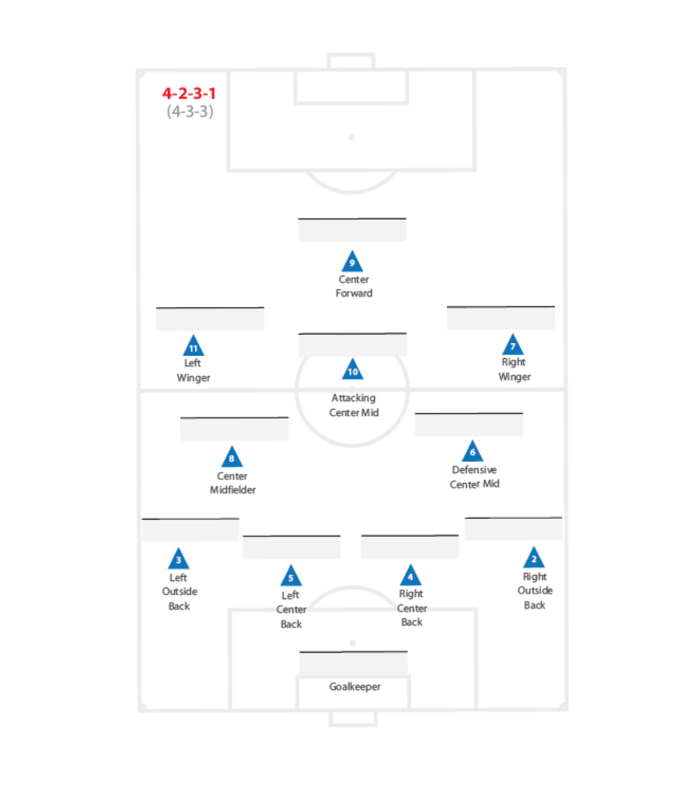

In [ ]:
img = mpimg.imread("soccer_positions.png")

# Display the image
plt.figure(figsize = (12, 10))
plt.imshow(img)
plt.axis('off')
plt.show()

Source: https://www.ssl-nc.com/soccer-positions#:~:text=Soccer%20Positions%20*%20Goalkeeper.%20*%20Defender%20(Centre%2Dback%2C,*%20Forward%20(Centre%20forward%2C%20Second%20striker%2C%20Winger)

Based on the provided source above, our recommended mapping is:

- Goalkeeper (GK): ['GK'] gets mapped to GK
- Defenders (DEF): ['CB', 'LB', 'RB', 'LWB', 'RWB'] gets mapped to DEF
- Midfielders (MID): ['CDM', 'CM', 'CAM', 'LM', 'RM'] gets mapped to MID
- Forwards (FWD): ['ST', 'CF', 'LW', 'RW'] gets mapped to FWD

We implement this mapping below.

In [ ]:
# Define the mapping
position_map = {'GK': 'GK',
                'CB': 'DEF',
                'LB': 'DEF',
                'RB': 'DEF',
                'LWB': 'DEF',
                'RWB': 'DEF',
                'CDM': 'MID',
                'CM': 'MID',
                'CAM': 'MID',
                'LM': 'MID',
                'RM': 'MID',
                'ST': 'FWD',
                'CF': 'FWD',
                'LW': 'FWD',
                'RW': 'FWD'}

# Execute the Mapping
fifa_clean['broad_position'] = fifa_clean['preferred_position'].map(position_map)

# Check
fifa_clean[['preferred_position', 'broad_position']].head(10)

,preferred_position,broad_position
0,CF,FWD
1,CAM,MID
2,CM,MID
3,LW,FWD
4,CB,DEF
5,CB,DEF
6,RW,FWD
7,ST,FWD
8,GK,GK
9,ST,FWD


Once we have created the broad_position variable, we can drop the preferred_position column.

In [ ]:
# Drop the preferred_position column
fifa_clean = fifa_clean.drop(columns = ['preferred_position'])

fifa_clean.shape

(17699, 45)

### Feature Selection

Before modeling, it is important to carefully select the features to include in the analysis. This represents the formal feature selection stage of data wrangling, although we have already performed some preliminary selection earlier.

The goal is to retain features that directly contribute to predicting a player's broad position on the soccer field and modeling economic value. We also want to remove variables that are purely identifiers, redundant, or unnecessary. This ensures the dataset remains manageable, interpretable, and focused on meaningful predictors, reducing noise and minimizing multicollinearity from overlapping variables.

Some columns in the dataset, such as name, full_name, and birth_date, are purely identifiers or redundant with other features (e.g., age is derived from birth_date). These columns do not contribute predictive information for modeling player position or economic value and can safely be removed.

In [ ]:
# List of identifier columns to remove
identifier_cols = ['name', 'full_name', 'birth_date']

# Drop from the dataset
fifa_clean = fifa_clean.drop(columns=identifier_cols)

fifa_clean.shape

(17699, 42)

Below is the final, cleaned up dataset prior to standardization and dimensionality reduction.

In [ ]:
fifa_clean.head(10)

,age,height_cm,weight_kgs,overall_rating,potential,value_euro,wage_euro,preferred_foot,international_reputation(1-5),weak_foot(1-5),...,aggression,interceptions,positioning,vision,penalties,composure,marking,standing_tackle,sliding_tackle,broad_position
0,31,170.18,72.1,94,94,110500000.0,565000.0,Left,5,4,...,48,22,94,94,75,96,33,28,26,FWD
1,27,154.94,76.2,88,89,69500000.0,205000.0,Right,3,5,...,46,56,84,91,67,88,59,57,22,MID
2,25,190.50,83.9,88,91,73000000.0,255000.0,Right,4,4,...,78,64,82,88,82,87,63,67,67,MID
3,27,162.56,59.0,88,88,62000000.0,165000.0,Right,3,4,...,34,26,83,87,61,83,51,24,22,FWD
4,27,187.96,88.9,88,91,60000000.0,135000.0,Right,3,3,...,87,88,24,49,33,80,91,88,87,DEF
5,27,193.04,92.1,88,90,59500000.0,215000.0,Right,3,3,...,82,88,41,60,62,87,90,89,84,DEF
6,20,152.40,73.0,88,95,81000000.0,100000.0,Right,3,4,...,62,38,88,82,70,86,34,34,32,FWD
7,30,172.72,69.9,89,89,64500000.0,300000.0,Right,4,4,...,65,24,92,83,83,90,30,20,12,FWD
8,32,193.04,92.1,89,89,38000000.0,130000.0,Right,5,4,...,29,30,12,70,47,70,17,10,11,GK
9,32,185.42,77.1,89,89,60000000.0,200000.0,Right,4,4,...,84,48,93,77,85,82,52,45,39,FWD


Below we quickly check the distribution of the response variable, broad_position, to see if the classes are imbalanced.



In [ ]:
# Count the number of players in each broad position
position_counts = fifa_clean['broad_position'].value_counts()

# Compute percentages
position_percent = fifa_clean['broad_position'].value_counts(normalize=True) * 100

print("Counts of players by broad position:", position_counts, "\n")
print("Percentage of players by broad position:", position_percent)

Counts of players by broad position: broad_position
MID    6578
DEF    5801
FWD    3296
GK     2024
Name: count, dtype: int64 

Percentage of players by broad position: broad_position
MID    37.165942
DEF    32.775863
FWD    18.622521
GK     11.435674
Name: proportion, dtype: float64


The distribution of players across broad positions is uneven. Midfielders (MID) and defenders (DEF) make up the majority of the dataset, representing approximately 37.17% and 32.76% of players, respectively. Forwards (FWD) account for about 18.62% of players, while goalkeepers (GK) comprise the smallest group at roughly 11.44%.

Although this result reflects a moderate imbalance in class proportions, the distribution is consistent with real-world soccer team structures, where only one goalkeeper is on the field at a time and formations typically include more defenders and midfielders than forwards. Therefore, the imbalance is structural rather than the result of sampling bias.

However, when predicting broad_position, modeling techniques may still require adjustments such as class weighting or resampling to ensure that minority classes are not underrepresented in predictive performance.

# Research Question 1: Can player technical attributes predict a player's broad playing position (DEF/MID/FWD/GK)?

# PCA Assumptions

Now that the data is "clean" we can generate a few visualizations. These visualizations are helpful for verifying the assumptions for PCA.

PCA is an unsupervised learning dimensionality reduction technique designed to reduce the data from $p$ to $d$ dimensions, such that $d < p$, and simultaneously keep as much of the original variation (information) as possible. As such, this technique relies on several key assumptions. Checking these assumptions ensures that the technique is appropriate. Moreover, checking the assumptions ensures that the results are meaningful, and that the conclusions drawn are reliable.
The assumptions associated with PCA are:
- features are measured on a continuous scale (i.e., ratio or interval)
- there are linear relationships among the features
- the sample size is adequate to provide stable results (i.e., large enough sample sizes)
- the data is suitable for dimensionality reduction (i.e., adequate correlations)
- there are no significant outliers that could unduly influence the results

We will evaluate each of these assumptions before performing PCA.

Recalling the data wrangling phase, all input features are measured on a continuous scale. This satisfies the first assumption of PCA. This is a necessay assumption because variance and covariance values are only meaningful for continuous features.

With this condition met, we may now proceed to examine the remaining assumptions.

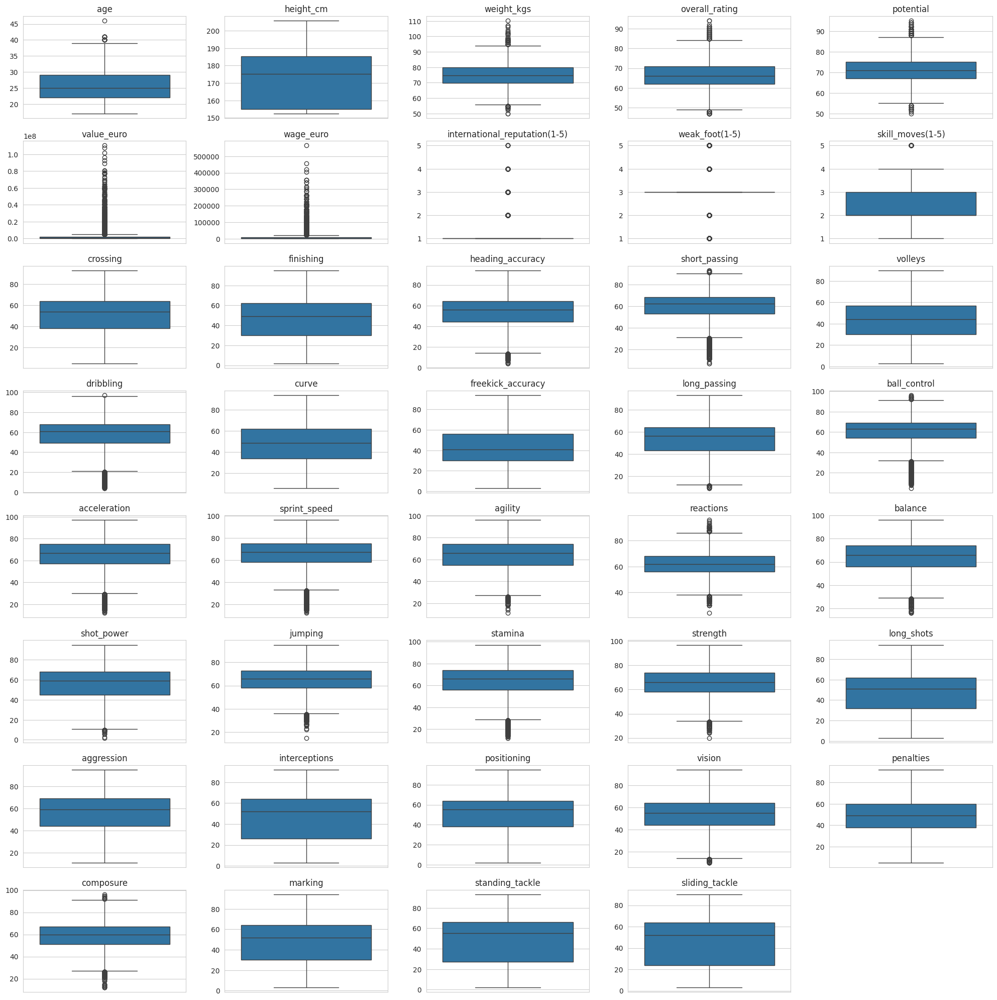

In [ ]:
sns.set_style("whitegrid")

# Select numeric features only for boxplots
numeric_features = fifa_clean.select_dtypes(include = ['int64', 'float64', 'float32']).columns

# Determine grid size
n_cols = 5
n_rows = math.ceil(len(numeric_features) / n_cols)

fig = plt.figure(figsize = (20, 20))

# Plot boxplots for each numeric feature
for i, col in enumerate(numeric_features):
    ax = fig.add_subplot(n_rows, n_cols, i + 1)
    sns.boxplot(y=fifa_clean[col], ax=ax)
    ax.set_title(col, fontsize=12)
    ax.set_xlabel('')
    ax.set_ylabel('')

plt.tight_layout()

# Save
plt.savefig("images/box_plots.png",
            dpi = 300,
            bbox_inches = 'tight')
plt.show()

The economic variables are very right skewed. We need to standardize all of these variables.

As is the case with most statistical analyses, outliers can skew the results. PCA is sensitive to outliers because they can disproportionately influence the directions of maximum variance.

Using the boxplots above, we can examined the input features for potential outliers. While some features contain extreme values, these values are not alarming. We consider the outliers assumption satisfied and proceed with PCA.

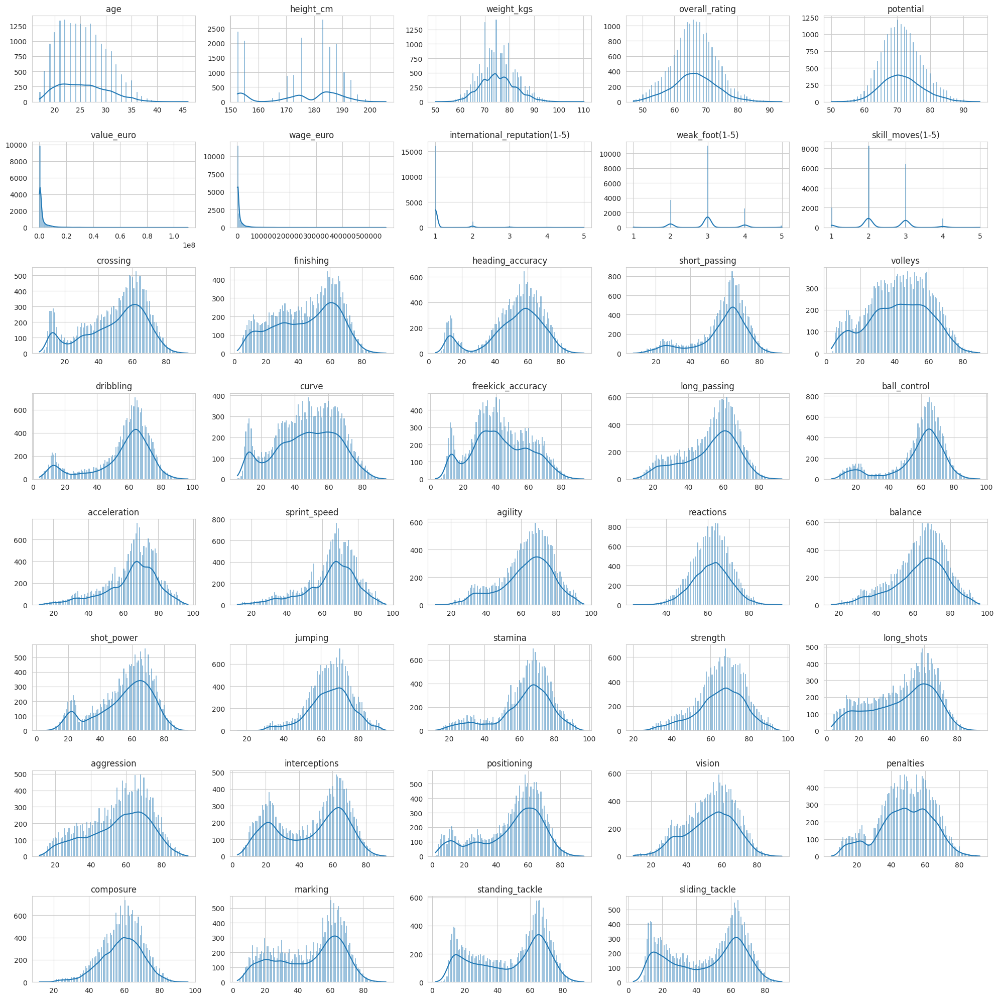

In [ ]:
sns.set_style("whitegrid")

# Determine grid size
n_cols = 5
n_rows = math.ceil(len(numeric_features) / n_cols)

fig = plt.figure(figsize = (20, 20))

# Sqrt Rule for number of bins
num_bins = int(np.sqrt(fifa_clean.shape[0]))  # number of rows in dataset

# Plot histograms
for i, col in enumerate(numeric_features):
    ax = fig.add_subplot(n_rows, n_cols, i + 1)
    sns.histplot(fifa_clean[col], bins=num_bins, kde=True, ax=ax)
    ax.set_title(col, fontsize=12)
    ax.set_xlabel('')
    ax.set_ylabel('')

plt.tight_layout()

# Save
plt.savefig("images/histogram_plots.png",
            dpi = 300,
            bbox_inches = 'tight')
plt.show()

Below we provide a pairplot of the most interesting variables. We do not include all the variables, because it creates a mess of a graphic. (And it takes forever to generate).

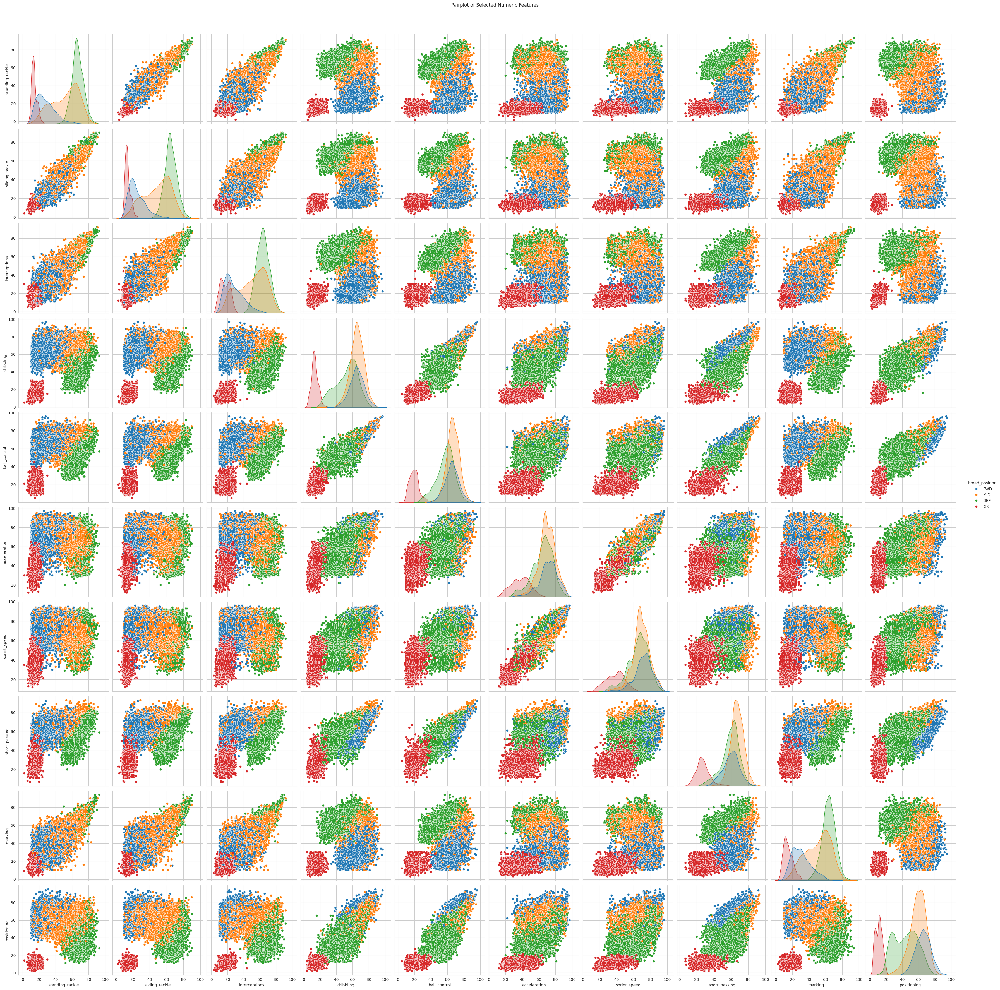

In [ ]:
sns.set_style("whitegrid")

# pick a smaller subset for readability
subset_features = ['standing_tackle', 'sliding_tackle', 'interceptions', 'dribbling', 'ball_control',
                   'acceleration', 'sprint_speed', 'short_passing', 'marking', 'positioning', 'broad_position']

# Pairplot
pairplot = sns.pairplot(fifa_clean[subset_features], hue = "broad_position", height = 3.5)
pairplot.fig.suptitle("Pairplot of Selected Numeric Features", y = 1.02)

# Save
plt.savefig("images/pair_plot.png",
            dpi = 300,
            bbox_inches = 'tight')
plt.show()

The pairplots reveal that most feature relationships are approximately linear, although some relationships are fairly noisy. Certain scatterplots show strong linear trends.

Other features show weak or scattered relationships. Because PCA identifies directions of maximum variance, these features will most likely contribute less to the principal components captured by PCA.

Overall, the pairplots suggest that the data set contains sufficient linear relationships among the features to justify the use of PCA.

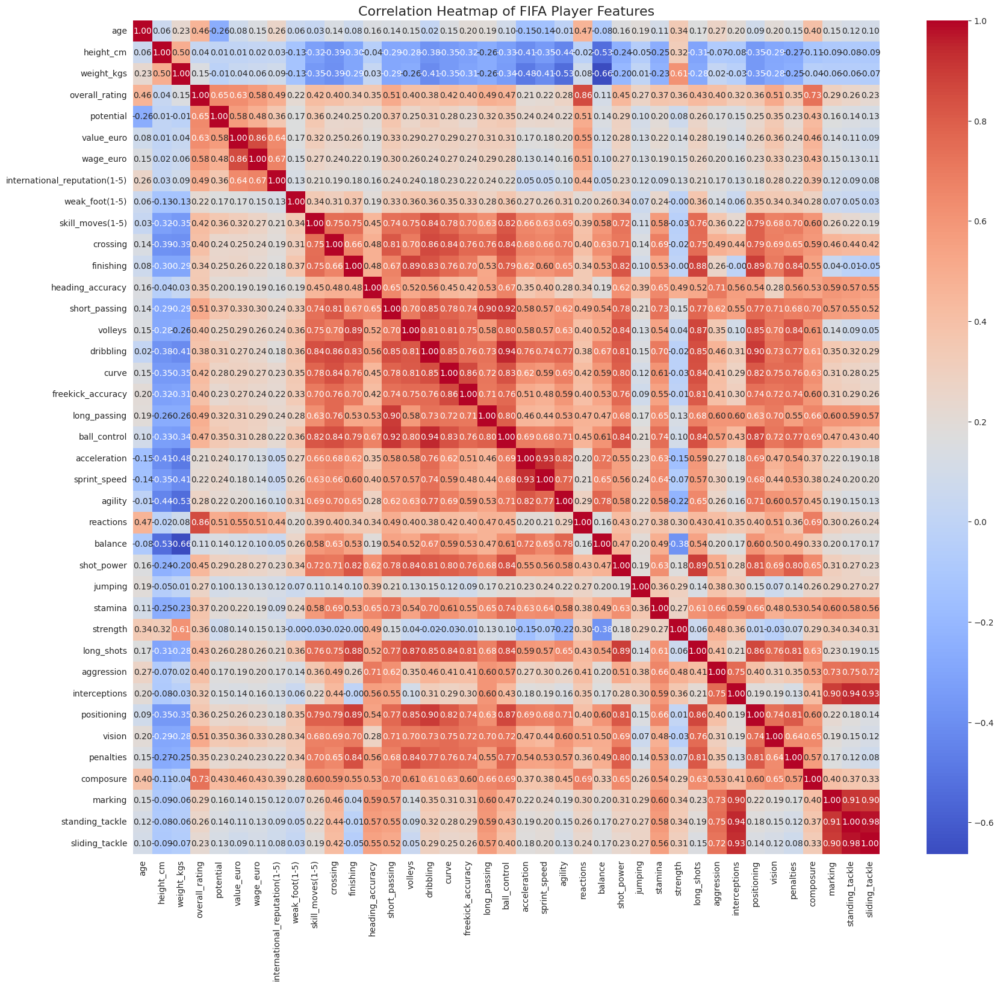

In [ ]:
# Compute correlation matrix
corr_matrix = fifa_clean[numeric_features].corr()

# Plot heatmap
plt.figure(figsize = (20, 18))

sns.heatmap(corr_matrix, annot = True, cmap = 'coolwarm', fmt = ".2f")
plt.title("Correlation Heatmap of FIFA Player Features", fontsize = 16)

# Save
plt.savefig("images/corr_plot.png",
            dpi = 300,
            bbox_inches = 'tight')
plt.show()

Examining the correlation matrix confirms several patterns observed in the pairplots.

Many features show very strong positive correlations (i.e., values close to 1). This is is to be expected given the nature of the data set. Many variable capture the same type of information on the soccer player. In contrast, there are very few strong negative correlations. Most negative correlations are small (i.e., close to zero), except for the two variables height and weight. This means that most features either increase together or are relatively independent.

Overall, the correlations are sufficient to proceed with dimensionality reduction using PCA.

There is no universally agreed-upon threshold for an adequate sample size in PCA, and recommendations vary in the literature.

Given that our sample size is 17699, we can confidently say that our dataset meets the recommended guidelines. We therefore conclude that the sample adequacy assumption for PCA has been satisfied.

In [ ]:
fifa_clean.shape

(17699, 42)

# LDA Assumptions

LDA relies on two main assumptions:
1. The input features follow a multivariate normal distribution.
2. The variance-covariance matrix of the input features in
each class are the same.

The first assumption is satisfied by the histograms we generated in the PCA section.

In [ ]:
fifa_clean.info()

<class 'pandas.core.frame.DataFrame'>
Index: 17699 entries, 0 to 17953
Data columns (total 42 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   age                            17699 non-null  int64  
 1   height_cm                      17699 non-null  float64
 2   weight_kgs                     17699 non-null  float64
 3   overall_rating                 17699 non-null  int64  
 4   potential                      17699 non-null  int64  
 5   value_euro                     17699 non-null  float64
 6   wage_euro                      17699 non-null  float64
 7   preferred_foot                 17699 non-null  object 
 8   international_reputation(1-5)  17699 non-null  int64  
 9   weak_foot(1-5)                 17699 non-null  int64  
 10  skill_moves(1-5)               17699 non-null  int64  
 11  body_type                      17699 non-null  object 
 12  crossing                       17699 non-null  int6

In [ ]:
# Select numerical features only
numerical_features = ['age', 'height_cm', 'weight_kgs', 'overall_rating', 'potential',
                      'international_reputation(1-5)',
                      'weak_foot(1-5)', 'skill_moves(1-5)', 'crossing', 'finishing',
                      'heading_accuracy', 'short_passing', 'volleys', 'dribbling', 'curve',
                      'freekick_accuracy', 'long_passing', 'ball_control', 'acceleration',
                      'sprint_speed', 'agility', 'reactions', 'balance', 'shot_power',
                      'jumping', 'stamina', 'strength', 'long_shots', 'aggression',
                      'interceptions', 'positioning', 'vision', 'penalties', 'composure',
                      'marking', 'standing_tackle', 'sliding_tackle']

# Group the data by broad position
groups = fifa_clean['broad_position'].unique()

# Create a dictionary to store covariance matrices
cov_matrices = {}

for group in groups:
    group_data = fifa_clean[fifa_clean['broad_position'] == group][numerical_features]
    cov_matrices[group] = group_data.cov()

# Display covariance matrices
for group, cov_matrix in cov_matrices.items():
    print(f"\nCovariance matrix for {group}:\n")
    print(cov_matrix)


Covariance matrix for FWD:

                                     age   height_cm  weight_kgs  \
age                            21.593247    5.890220    8.606618   
height_cm                       5.890220  199.686529   45.942750   
weight_kgs                      8.606618   45.942750   49.942453   
overall_rating                 16.480778    5.607941    8.715383   
potential                      -7.606440   -1.606271   -2.286228   
international_reputation(1-5)   0.670635    0.144540    0.268923   
weak_foot(1-5)                  0.439243   -0.313942    0.008262   
skill_moves(1-5)                0.547165   -1.185303   -0.577667   
crossing                       20.338128  -34.478507  -16.446663   
finishing                      16.446349   11.742205   13.400076   
heading_accuracy               24.524116   54.330208   42.525965   
short_passing                  17.356869   -5.057163    1.350429   
volleys                        28.670813   15.639877   17.039871   
dribbling          

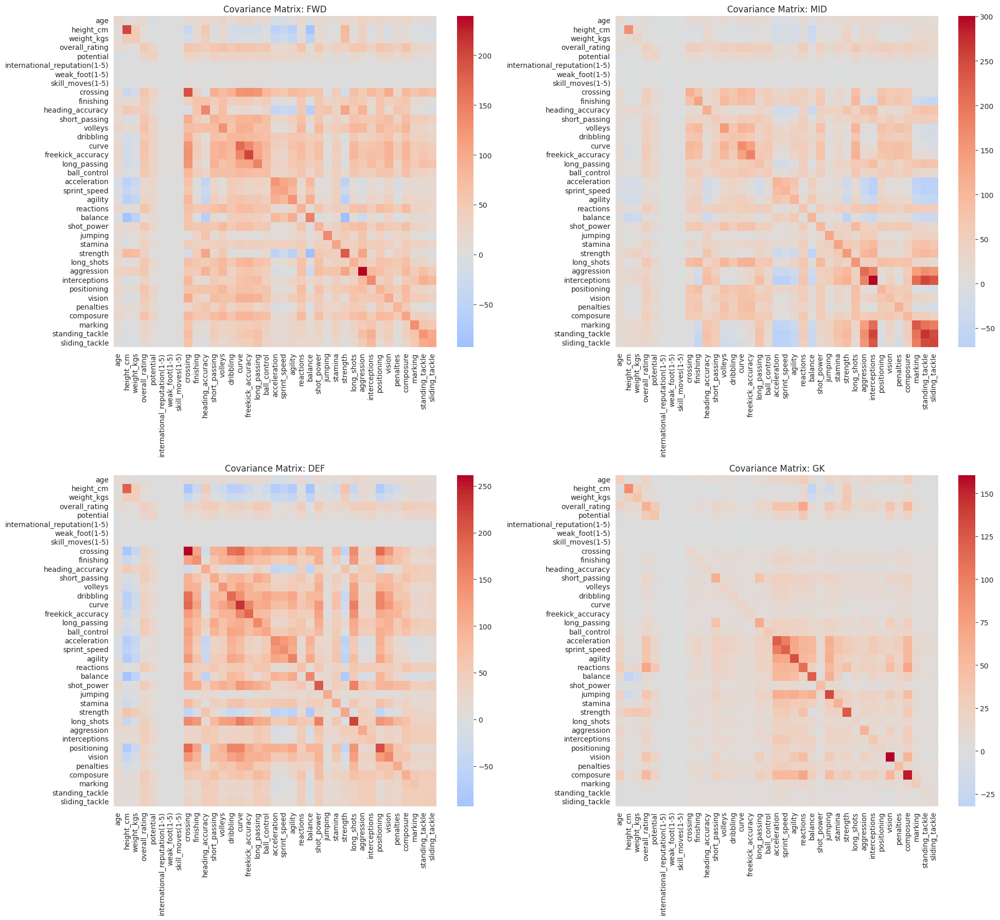

In [ ]:
# Set up a 2x2 grid for the four groups
fig, axes = plt.subplots(2, 2, figsize=(20, 18))
axes = axes.flatten()

for i, group in enumerate(groups):
    sns.heatmap(cov_matrices[group], ax=axes[i], cmap = 'coolwarm', center = 0)
    axes[i].set_title(f'Covariance Matrix: {group}')
    axes[i].tick_params(axis='x', rotation = 90)
    axes[i].tick_params(axis='y', rotation = 0)

plt.tight_layout()

# Save
plt.savefig("images/cov_plot.png",
            dpi = 300,
            bbox_inches = 'tight')
plt.show()

The covariance matrices for the input features are generally similar across the broad player positions, supporting the LDA assumption of roughly equal variance-covariance structures. The exception is the goalkeeper (GK) group, whose covariance matrix shows more pronounced differences. This is likely due to the relatively small number of goalkeepers in the dataset (approximately 11% of players), which can make the estimated covariances less stable and more sensitive to sampling variability. Overall, these results suggest that the equal covariance assumption is reasonably satisfied for midfielders, defenders, and forwards, while caution may be needed when interpreting LDA results for goalkeepers.

This perhaps gives us more reason to use SMOTE.

# Feature Encoding and Standardization

Before proceeding with dimensionality reduction, the dataset must be divided into training and test sets. Recall that value_euro and wage_euro represent economic outcomes. These variables are excluded here to prevent data leakage for our last research question. These variables will instead be reserved for the final stage of analysis, where the goal is to model player economic value directly.

In other words, the predictors ($X$) are defined as all columns except broad_position, value_euro, and wage_euro. The response ($y$) is defined by broad_position. Below we employ a 70/30 split with stratification to preserve the proportional representation of each class in both sets.

In [ ]:
# Define predictors (exclude economic variables)
X = fifa_clean.drop(columns = ['broad_position', 'value_euro', 'wage_euro'])
y = fifa_clean['broad_position']

# 70/30 split with stratification
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size = 0.30,
                                                    random_state = 42,
                                                    stratify = y)

print("Training set size:", X_train.shape)
print("Test set size:", X_test.shape)

Training set size: (12389, 39)
Test set size: (5310, 39)


After splitting the dataset into training and test sets, we must construct a preprocessing pipeline. This is achieved using `ColumnTransformer`, `StandardScaler`, and `OneHotEncoder`. This approach ensures that all transformations are applied systematically. The inspiration for the code below comes from https://www.geeksforgeeks.org/machine-learning/using-columntransformer-in-scikit-learn-for-data-preprocessing/.

In our implementation, numeric variables are standardized using `StandardScaler`. This command centers each feature at zero and scales it to unit variance. As we have mentioned before, standardizing variables ensures that measurements captured on different scales contribute proportionally. The nominal variables preferred_foot and body_type are encoded using `OneHotEncoder`. This converts the categorical values into binary indicator variables.

These transformations are combined within `ColumnTransformer`, which allows the numeric and categorical features to be processed simultaneously. The preprocessing pipeline is fitted only on the training data and then applied to the test data, preventing the potential for data leakage.

A quick note: recall that the FIFA dataset contain ordinal variables (i.e., international_reputation(1-5), weak_foot(1-5), and skill_moves(1-5)). Because PCA and many machine learning algorithms operate on variance, not on measurement scales, standardizing them does not destroy their ordering.

In [ ]:
# numeric features
numeric_features = ['age', 'height_cm', 'weight_kgs', 'overall_rating', 'potential',
    'international_reputation(1-5)', 'weak_foot(1-5)', 'skill_moves(1-5)',
    'crossing', 'finishing', 'heading_accuracy', 'short_passing', 'volleys',
    'dribbling', 'curve', 'freekick_accuracy', 'long_passing',
    'ball_control', 'acceleration', 'sprint_speed', 'agility', 'reactions',
    'balance', 'shot_power', 'jumping', 'stamina', 'strength', 'long_shots',
    'aggression', 'interceptions', 'positioning', 'vision', 'penalties',
    'composure', 'marking', 'standing_tackle', 'sliding_tackle']

# categorical features
categorical_features = ['preferred_foot', 'body_type']

In [ ]:
# preprocessing pipeline
preprocessor = ColumnTransformer(
    transformers = [('num', StandardScaler(), numeric_features),
     ('cat', OneHotEncoder(drop = 'first', handle_unknown = 'ignore'), categorical_features)])

# Fit on training data and transform
X_train_processed = preprocessor.fit_transform(X_train)

# Apply same transformations to test data
X_test_processed = preprocessor.transform(X_test)

print("Processed training set shape:", X_train_processed.shape)
print("Processed test set shape:", X_test_processed.shape)

Processed training set shape: (12389, 40)
Processed test set shape: (5310, 40)


# Model Development and Evaluation

In this section, we will generate predictive models for player positions using two separate dimensionality reduction approaches: PCA and LDA.

For each feature space, we will train three classifiers: multinomial logistic regression, K-nearest neighbors, and Naive Bayes. We wil use a 10-fold stratified cross validation approach to tune hyperparameters and estimate performance. Models will be compared based on their cross validation accuracy only. This ensures an unbiased assessment of model generalization to unseen data. The test set is used only to evaluate the final models. The test set, therefore, provides an independent assessment of model performance without influencing model selection.

## Dimensionality Reduction with PCA

Dimensionality reduction is a key step when working with datasets that contain many correlated features. This step helps simplify the data while retaining the most important information. In our FIFA dataset, many player attributes, such as short_passing, long_passing, and ball_control are highly correlated. Including all of these variables in modeling can introduce redundancy and multicollinearity.

We will fit PCA on the training data only. We will then apply the transformation to the test set. Examining the explained variance of the components will help determine how many dimensions are necessary to retain most of the information.

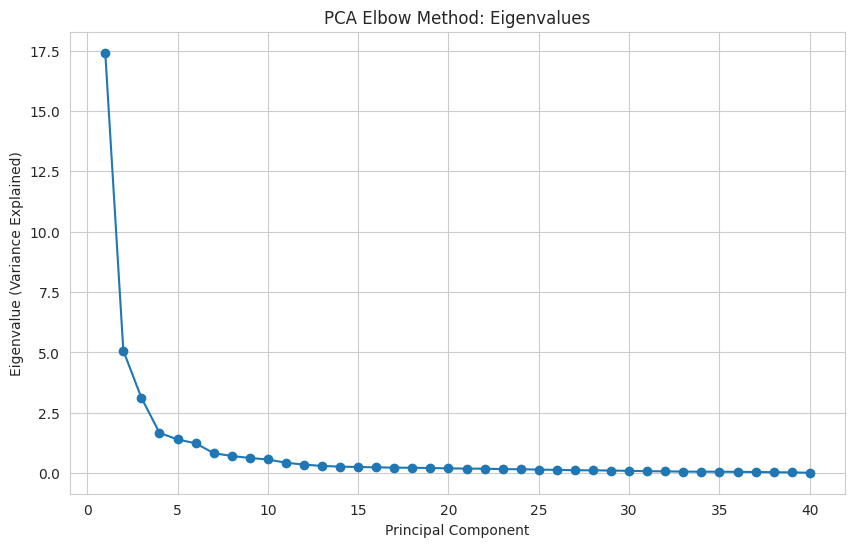

In [ ]:
# Fit PCA on standardized training data
pca = PCA(random_state = 42)
pca.fit(X_train_processed)

# Eigenvalues (explained variance)
eigenvalues = pca.explained_variance_

plt.figure(figsize = (10, 6))

plt.plot(np.arange(1, len(eigenvalues)+1), eigenvalues, marker = 'o')
plt.xlabel("Principal Component")
plt.ylabel("Eigenvalue (Variance Explained)")
plt.title("PCA Elbow Method: Eigenvalues")
plt.grid(True)

# Save
plt.savefig("images/pca.png",
            dpi = 300,
            bbox_inches = 'tight')
plt.show()

In [ ]:
eigenvalues

array([17.40804017,  5.07546474,  3.12628287,  1.67409226,  1.39946896,
        1.24126988,  0.83211408,  0.71637132,  0.63255138,  0.57086086,
        0.43566405,  0.35817255,  0.30362236,  0.27484492,  0.25864184,
        0.24574579,  0.23324248,  0.22706661,  0.21764828,  0.20313371,
        0.19226322,  0.18991144,  0.17126267,  0.16688413,  0.1516104 ,
        0.1398782 ,  0.12594342,  0.12095127,  0.11354362,  0.09978872,
        0.08632596,  0.07770676,  0.06938476,  0.06490829,  0.06420638,
        0.05874012,  0.0533313 ,  0.04238947,  0.03542098,  0.02241506])

In [ ]:
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)

print(cumulative_variance)

[0.46444768 0.59986142 0.68327085 0.72793575 0.76527367 0.79839084
 0.82059169 0.83970453 0.85658104 0.87181165 0.88343519 0.89299126
 0.90109193 0.90842481 0.91532539 0.9218819  0.92810483 0.93416298
 0.93996985 0.94538947 0.95051907 0.95558592 0.96015522 0.9646077
 0.96865267 0.97238463 0.97574481 0.9789718  0.98200115 0.98466352
 0.9869667  0.98903993 0.99089112 0.99262287 0.9943359  0.99590309
 0.99732598 0.99845693 0.99940196 1.        ]


Both the Elbow method and Kaiser's Criterion (eigenvalues $\geq 1$) initially suggest that retaining six principal components is appropriate. These six components capture a substantial portion of the variability in the numeric and encoded FIFA features, explaining 79.84% of the total variance in the dataset. This indicates that a large amount of the overall structure in the data can be represented in a much lower-dimensional space.

However, while six components capture the majority of the variance, our objective is to retain a sufficiently rich representation of the data. To ensure that minimal structural information is lost, we instead aim to retain enough principal components to explain at least 90% of the total variance. In this case, that requires 13 principal components. Although this results in a slightly higher dimensional representation than suggested by the elbow criterion, it provides a better balance between dimensionality reduction and information retention.

In [ ]:
# minimum components needed for >= 90%
n_components_90 = np.argmax(cumulative_variance >= 0.90) + 1

print("Number of components to reach at least 90% variance:", n_components_90)

Number of components to reach at least 90% variance: 13


We can now fit PCA with `n_components = 13` and transform the training and test sets.

In [ ]:
# Fit PCA with 13 components
pca = PCA(n_components = n_components_90, random_state = 42)
X_train_pca = pca.fit_transform(X_train_processed)
X_test_pca = pca.transform(X_test_processed)

print("Shape of training data after PCA:", X_train_pca.shape)
print("Shape of test data after PCA:", X_test_pca.shape)

Shape of training data after PCA: (12389, 13)
Shape of test data after PCA: (5310, 13)


Now that we have reduced the features in the dataset, we can train a classifier to predict broad_position.

### Multinomial Logistic Regression Classifier After PCA

To classify player positions using multinomial logistic regression, we use a pipeline that combines Synthetic Minority Oversampling Technique (SMOTE) with cross validated hyperparameter tuning.

This approach addresses two main issues. First, the positional classes are imbalanced. SMOTE generates synthetic examples for the minority classes, allowing the model to learn more balanced decision boundaries and reducing bias toward majority classes.

Second, we use a 10-fold stratified cross validation within a `GridSearchCV` framework to tune the regularization parameter `C` for logistic regression. Stratification ensures that each fold preserves the relative proportion of each position class. Cross validation provides a reliable estimate of model performance on unseen data and identifies the optimal regularization strength.

The pipeline ensures that SMOTE is applied only to the training fold in each CV iteration, preventing oversampling from affecting the test data. By integrating SMOTE and the classifier into a single pipeline, we maintain correct separation between training and evaluation.

Finally, after selecting the best `C` via cross validation, we fit the final model on the full training set and evaluate performance on the held-out test set. The classification report and confusion matrix summarize the model's ability to correctly identify each broad positional class.

The inspiration for this framework comes from the following 2 Stack Overflow posts: https://stackoverflow.com/questions/48370150/how-to-implement-smote-in-cross-validation-and-gridsearchcv and https://stackoverflow.com/questions/58613854/should-i-perform-gridsearch-for-tunning-hyper-parameters-before-or-after-smote.

**Fun Fact:** According to the documentation using `n_jobs = -1` means that we use all processors for computation.

Source: https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html

In [ ]:
# Define the pipeline
pipeline = Pipeline([('smote', SMOTE(sampling_strategy = 'minority', random_state = 42)),
 ('model', LogisticRegression(max_iter = 1000, random_state = 42))])

# Hyperparameter grid
p_grid = dict(model__C = [0.01, 0.1, 1, 5, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 150])

# 10-fold stratified CV
cv = StratifiedKFold(n_splits = 10, shuffle = True, random_state = 42)

# grid search
grid_search = GridSearchCV(estimator = pipeline,
                           param_grid = p_grid,
                           cv = cv,
                           scoring = 'accuracy',
                           n_jobs = -1)

grid_search.fit(X_train_pca, y_train)

# Best logistic regression model
best_logreg = grid_search.best_estimator_

# Best value of C found by CV
print("Best C value:", grid_search.best_params_['model__C'])

# Mean cross-validation accuracy for the best C
print("Best CV accuracy:", grid_search.best_score_)

Best C value: 80
Best CV accuracy: 0.8790052298677473


Based on the result above, the optimal `C` was found to be 80. This is a very large value, which means the model is almost ignoring the penalty on large coefficients. This value for the regularization parameter achieves a mean CV accuracy of approximately 87.90%.

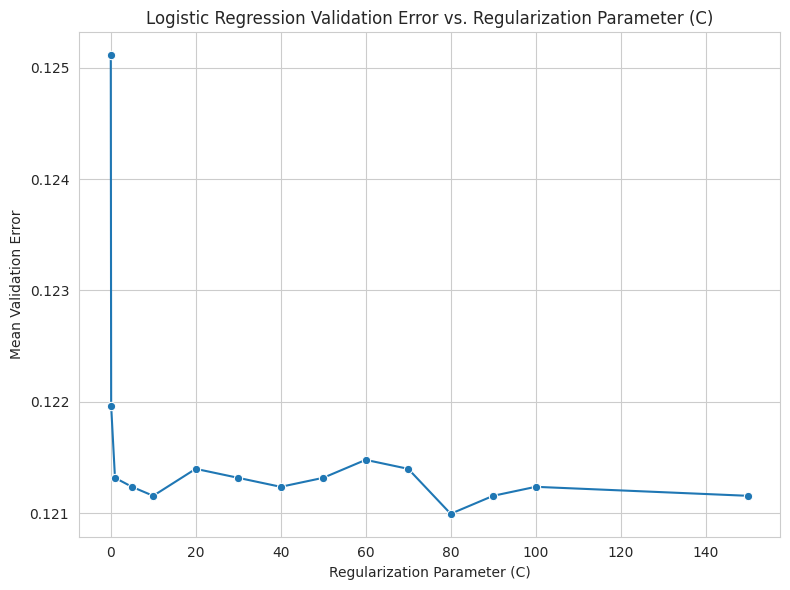

In [ ]:
# Extract CV results
cv_results = grid_search.cv_results_

C_values = cv_results['param_model__C'].data.astype(float)
mean_validation_accuracy = cv_results['mean_test_score']
mean_validation_error = 1 - mean_validation_accuracy

# Create dataframe
error_df = pd.DataFrame({'C': C_values, 'Validation Error': mean_validation_error}).sort_values(by = 'C')

# Plot
plt.figure(figsize=(8, 6))
sns.set_style("whitegrid")

sns.lineplot(data = error_df,
             x = 'C',
             y = 'Validation Error',
             marker = 'o')

plt.title("Logistic Regression Validation Error vs. Regularization Parameter (C)")
plt.xlabel("Regularization Parameter (C)")
plt.ylabel('Mean Validation Error')
plt.tight_layout()

# Save
plt.savefig("images/logreg_error.png",
            dpi = 300,
            bbox_inches = 'tight')
plt.show()

We can now evaluate the classifier's performance on the test set.

In [ ]:
# Predict on test data
y_pred = best_logreg.predict(X_test_pca)

# Compute accuracy
test_accuracy = accuracy_score(y_test, y_pred)
print("Test Accuracy:", test_accuracy)

# Classification report
print("\nClassification Report:\n", classification_report(y_test, y_pred))

# Confusion matrix
conf_mat = confusion_matrix(y_test, y_pred, labels=['DEF', 'MID', 'FWD', 'GK'])
conf_mat_df = pd.DataFrame(conf_mat, index = ['DEF', 'MID', 'FWD', 'GK'], columns = ['DEF', 'MID', 'FWD', 'GK'])
print("\nConfusion Matrix:\n", conf_mat_df)

Test Accuracy: 0.8772128060263653

Classification Report:
               precision    recall  f1-score   support

         DEF       0.91      0.92      0.92      1740
         FWD       0.83      0.79      0.81       989
          GK       1.00      1.00      1.00       607
         MID       0.83      0.84      0.84      1974

    accuracy                           0.88      5310
   macro avg       0.89      0.89      0.89      5310
weighted avg       0.88      0.88      0.88      5310


Confusion Matrix:
       DEF   MID  FWD   GK
DEF  1604   135    1    0
MID   155  1662  157    0
FWD     3   201  785    0
GK      0     0    0  607


The model achieved an overall accuracy of approximately 87.72% on the test set.

Precision was highest for goalkeepers and defenders, with scores of 1.00 and 0.91, respectively. Forwards and midfielders both had a precision of 0.83. This model demonstrates that even with a reduced feature space, we are able to capture meaningful distinctions between player roles.

Forwards and midfielders are more frequently confused with each other, as seen in the confusion matrix. In particular, 157 midfielders were misclassified as forwards, and 201 forwards as midfielders. This suggests that the features used for PCA retain enough information to distinguish broad roles, but midfield and forward positions have overlapping characteristics that make them harder to separate.

### k-Nearest Neighbors After PCA

We now implement a K-Nearest Neighbors (KNN) classifier using the same modeling framework as logistic regression. Specifically, we apply 10-fold stratified cross validation within a `GridSearchCV` framework to tune the hyperparameter k (number of neighbors). Stratification ensures that each fold preserves the class distribution of player positions.

The k-NN algorithm requires the specification of two key components: a distance metric and the number of neighbors $k$. The distance metric defines how similarity between observations is measured and $k$ determines how many nearby observations are used to make a prediction.

To determine the optimal number of neighbors $k$ for our k-NN classifier, we test a range of candidate $k$ values from 1 to 50. For each $k$, a k-NN model is created with the following specifications:
- Euclidean distance
- Distance-weighted voting (`weights = 'distance'`), so that closer neighbors contribute more strongly to the classification decision

Because KNN is particularly sensitive to class imbalance, we incorporate SMOTE within the pipeline once again. This ensures that oversampling occurs only within the training folds during cross validation. By maintaining the same cross validation and preprocessing structure used for logistic regression, we are able to directly compare between models.

In [ ]:
# Define pipeline
pipeline_knn = Pipeline([('smote', SMOTE(sampling_strategy = 'minority', random_state = 42)),
 ('model', KNeighborsClassifier(weights = 'distance', metric = 'euclidean'))])

# Hyperparameter grid
param_grid_knn = dict(model__n_neighbors = list(range(1, 51)))

# 10-fold stratified CV
cv = StratifiedKFold(n_splits = 10, shuffle = True, random_state = 42)

# Grid search
grid_search_knn = GridSearchCV(estimator = pipeline_knn,
                               param_grid = param_grid_knn,
                               cv = cv,
                               scoring = 'accuracy',
                               n_jobs = -1)

# fit on training data
grid_search_knn.fit(X_train_pca, y_train)

# Best model
best_knn = grid_search_knn.best_estimator_

# Best hyperparameters
print("Best k:", grid_search_knn.best_params_['model__n_neighbors'])
print("Best CV accuracy:", grid_search_knn.best_score_)

Best k: 36
Best CV accuracy: 0.8687550932861849


Using 10-fold stratified cross validation, the optimal number of neighbors was $k = 36$. This value of $k$ achieved a mean CV accuracy of approximately 86.88%.

The relatively large value of $k$ suggests that smoother decision boundaries improve generalization performance. However, multinomial logistic regression achieved a slightly larger mean cross validated accuracy. Therefore, the multinomial logistic regression model provides a better fit for this dataset.

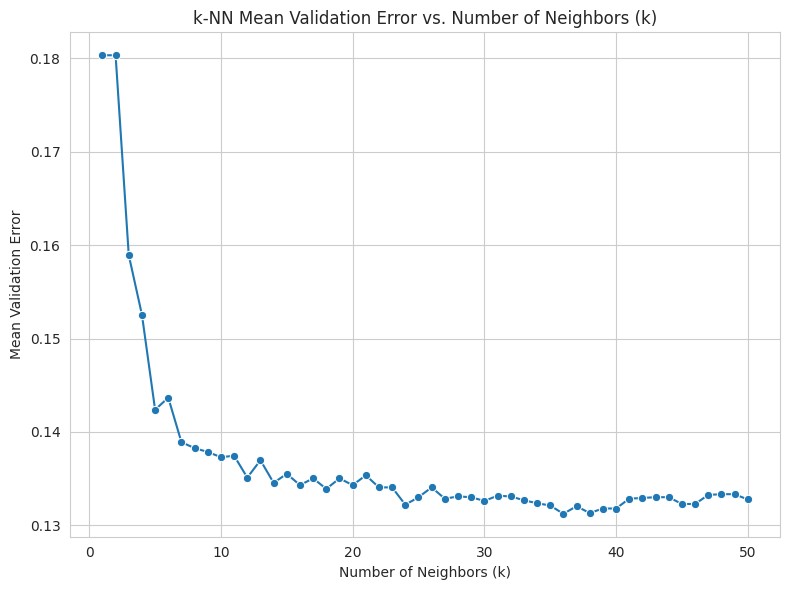

In [ ]:
# Extract CV results
cv_results = grid_search_knn.cv_results_

k_values = cv_results['param_model__n_neighbors'].data.astype(int)
mean_validation_accuracy = cv_results['mean_test_score']
mean_validation_error = 1 - mean_validation_accuracy

# Create dataframe
error_df = pd.DataFrame({'k': k_values,'Validation Error': mean_validation_error}).sort_values(by='k')

# Plot
plt.figure(figsize = (8, 6))

sns.set_style("whitegrid")

sns.lineplot(data=error_df,
             x='k',
             y='Validation Error',
             marker='o')

plt.title('k-NN Mean Validation Error vs. Number of Neighbors (k)')
plt.xlabel('Number of Neighbors (k)')
plt.ylabel('Mean Validation Error')
plt.tight_layout()

# Save
plt.savefig("images/knn_error.png",
            dpi = 300,
            bbox_inches = 'tight')
plt.show()

We can now evaluate the classifier's performance on the test set.

In [ ]:
# Evaluate on test set
y_pred_knn = best_knn.predict(X_test_pca)

# Compute accuracy
test_accuracy = accuracy_score(y_test, y_pred_knn)
print("Test Accuracy:", test_accuracy)

# Classification report
print("\nClassification Report:\n", classification_report(y_test, y_pred_knn))

# Confusion matrix
conf_mat_knn = confusion_matrix(y_test, y_pred_knn, labels = ['DEF', 'MID', 'FWD', 'GK'])
conf_mat_knn_df = pd.DataFrame(conf_mat_knn, index = ['DEF', 'MID', 'FWD', 'GK'], columns = ['DEF', 'MID', 'FWD', 'GK'])
print("\nConfusion Matrix:\n", conf_mat_knn_df)

Test Accuracy: 0.868361581920904

Classification Report:
               precision    recall  f1-score   support

         DEF       0.90      0.90      0.90      1740
         FWD       0.87      0.76      0.81       989
          GK       1.00      1.00      1.00       607
         MID       0.80      0.86      0.83      1974

    accuracy                           0.87      5310
   macro avg       0.89      0.88      0.88      5310
weighted avg       0.87      0.87      0.87      5310


Confusion Matrix:
       DEF   MID  FWD   GK
DEF  1558   182    0    0
MID   162  1696  116    0
FWD     2   237  750    0
GK      0     0    0  607


The distance weighted k-NN model achieved a test accuracy of 86.84%. This accuracy value suggests a strong overall generalization performance that is consistent with the cross validation results.

The model performs perfectly for goalkeepers, achieving 100% precision and recall. Defensive players are also classified reliably. The precision and recall scores for this class are both 0.90. Midfielders show slightly lower precision (0.80) but solid recall (0.86). This shows that most true midfielders are correctly identified, but a small number of non-midfielders are misclassified as midfielders. The weakest performance is observed for forwards, where recall drops to 0.76. This means approximately 24% of true forwards are misclassified, most commonly as midfielders.

The confusion matrix confirms that the primary source of error arises from overlap between midfielders and forwards, and to a lesser extent between defenders and midfielders. Overall, the model demonstrates decent classification across classes.

### Naïve Bayes After PCA

For our multi-class player position classification problem, we use a Gaussian Naive Bayes classifier. Since our features are numeric (after PCA), `GaussianNB` should work well here.

To handle class imbalance, we again use SMOTE inside a pipeline, ensuring oversampling only occurs on the training folds during cross validation.

We can tune the var_smoothing parameter of `GaussianNB`, which adds a small amount to the variance to improve numerical stability, similar in spirit to regularization in Logistic Regression.

In [ ]:
# Define pipeline
pipeline_nb = Pipeline([('smote', SMOTE(sampling_strategy = 'minority', random_state = 42)),
 ('model', GaussianNB())])

# Hyperparameter grid
param_grid_nb = dict(model__var_smoothing = [1e-12, 1e-11, 1e-10, 1e-9, 1e-8, 1e-7, 1e-6, 1e-5, 1e-4, 1e-3])

# 10-fold stratified CV
cv = StratifiedKFold(n_splits = 10, shuffle = True, random_state = 42)

# grid search
grid_search_nb = GridSearchCV(estimator = pipeline_nb,
                              param_grid = param_grid_nb,
                              cv = cv,
                              scoring = 'accuracy',
                              n_jobs = -1)

# Fit on training data
grid_search_nb.fit(X_train_pca, y_train)

# Best model
best_nb = grid_search_nb.best_estimator_

# Best hyperparameter
print("Best var_smoothing:", grid_search_nb.best_params_['model__var_smoothing'])
print("Best CV accuracy:", grid_search_nb.best_score_)

Best var_smoothing: 0.001
Best CV accuracy: 0.8502704249740202


Using 10-fold stratified cross validation, the optimal var_smoothing for the Gaussian Naïve Bayes classifier was found to be $0.001$. This resulted in a mean CV accuracy of approximately 85.03%.

Overall, the model is able to reasonably distinguish between player positions, though its accuracy is slightly lower than that of logistic regression and K-NN on the same reduced feature space.

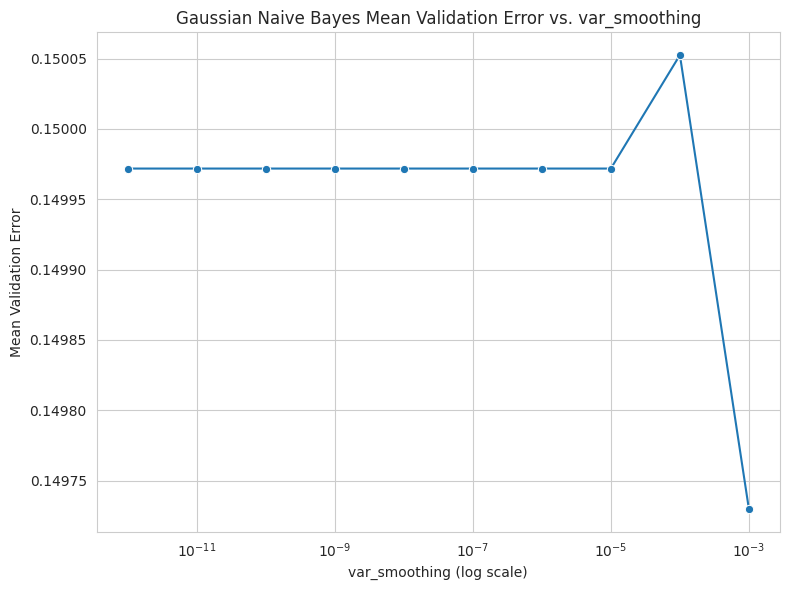

In [ ]:
# Extract CV results
cv_results = grid_search_nb.cv_results_

smoothing_values = cv_results['param_model__var_smoothing'].data
mean_validation_accuracy = cv_results['mean_test_score']
mean_validation_error = 1 - mean_validation_accuracy

# Create dataframe
error_df = pd.DataFrame({'var_smoothing': smoothing_values, 'Validation Error': mean_validation_error}).sort_values(by = 'var_smoothing')

# Plot
plt.figure(figsize=(8, 6))
sns.set_style("whitegrid")

sns.lineplot(data = error_df,
             x = 'var_smoothing',
             y = 'Validation Error',
             marker = 'o')

plt.xscale('log')
plt.title('Gaussian Naive Bayes Mean Validation Error vs. var_smoothing')
plt.xlabel('var_smoothing (log scale)')
plt.ylabel('Mean Validation Error')
plt.tight_layout()

# Save
plt.savefig("images/nb_error.png",
            dpi = 300,
            bbox_inches = 'tight')
plt.show()

We can now evaluate the classifier's performance on the test set.



In [ ]:
# Evaluate on test set
y_pred_nb = best_nb.predict(X_test_pca)
test_accuracy_nb = accuracy_score(y_test, y_pred_nb)
print("Test Accuracy:", test_accuracy_nb)

# Classification report
print("\nClassification Report:\n", classification_report(y_test, y_pred_nb))

# Confusion matrix
conf_mat_nb = confusion_matrix(y_test, y_pred_nb, labels = ['DEF', 'MID', 'FWD', 'GK'])
conf_mat_df_nb = pd.DataFrame(conf_mat_nb, index = ['DEF', 'MID', 'FWD', 'GK'], columns = ['DEF', 'MID', 'FWD', 'GK'])
print("\nConfusion Matrix:\n", conf_mat_df_nb)

Test Accuracy: 0.8534839924670433

Classification Report:
               precision    recall  f1-score   support

         DEF       0.92      0.84      0.87      1740
         FWD       0.84      0.78      0.81       989
          GK       1.00      1.00      1.00       607
         MID       0.77      0.86      0.81      1974

    accuracy                           0.85      5310
   macro avg       0.88      0.87      0.87      5310
weighted avg       0.86      0.85      0.85      5310


Confusion Matrix:
       DEF   MID  FWD   GK
DEF  1456   282    2    0
MID   131  1701  142    0
FWD     2   218  769    0
GK      0     0    1  606


The model achieved an overall accuracy of approximately 85.35% on the test set.

The classifier performs exceptionally well for goalkeepers, achieving perfect precision and recall. The model also achieves very high precision for defenders (0.92) and forwards (0.84). Midfielders show slightly lower precision (0.77) but reasonable recall (0.86).

Overall, despite using a reduced feature space via PCA and the simplicity of the Naive Bayes assumptions, the model effectively distinguishes between the four broad positional classes.

## Dimensionality Reduction with LDA

Linear Discriminant Analysis is a supervised dimensionality reduction technique designed for classification. It projects high dimensional data onto a lower dimensional space such that:

- Between class variance is maximized. That is, the centroids of the classes (GK, DEF, MID, FWD) are as far apart as possible.
- Within class variance is minimized. That is, the spread of points within each class is as small as possible.

This ensures that classes are well separated in the new feature space, making classification easier.

In [ ]:
# Initialize LDA (number of components = classes - 1 = 3)
lda = LinearDiscriminantAnalysis(n_components = 3)

# Fit LDA on the training data
lda.fit(X_train_processed, y_train)

# Transform training and test sets
X_train_lda = lda.transform(X_train_processed)
X_test_lda = lda.transform(X_test_processed)

print("LDA transformed training set shape:", X_train_lda.shape)
print("LDA transformed test set shape:", X_test_lda.shape)

LDA transformed training set shape: (12389, 3)
LDA transformed test set shape: (5310, 3)


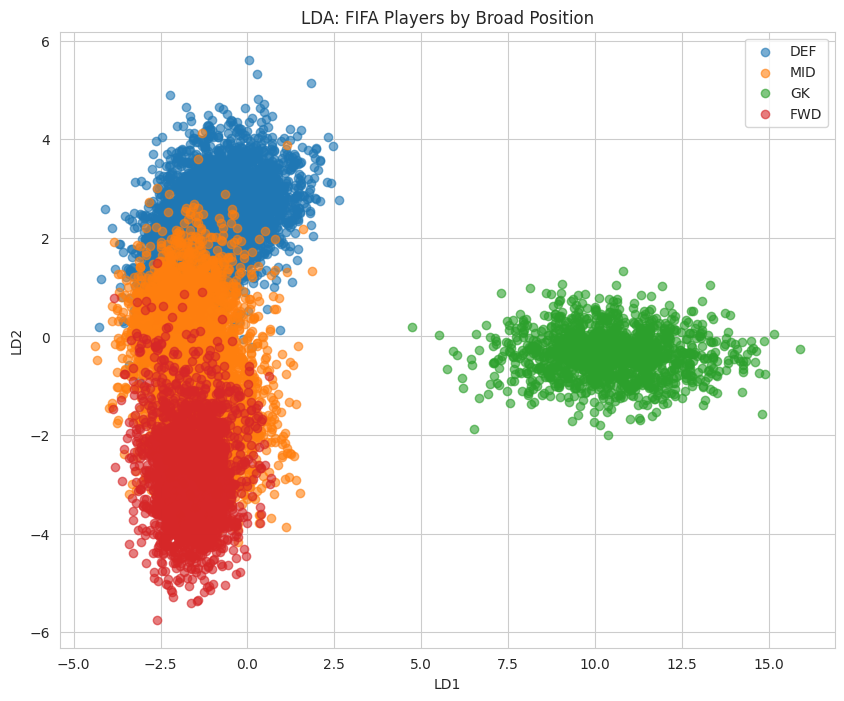

In [ ]:
# Convert to DataFrame for easier visualization
lda_train_df = pd.DataFrame(X_train_lda, columns=['LD1', 'LD2', 'LD3'])
lda_train_df['broad_position'] = y_train.values

# Quick 2D scatter plot using first two linear discriminants
plt.figure(figsize=(10, 8))
for cls in lda_train_df['broad_position'].unique():
    subset = lda_train_df[lda_train_df['broad_position'] == cls]
    plt.scatter(subset['LD1'], subset['LD2'], label=cls, alpha=0.6)

plt.xlabel("LD1")
plt.ylabel("LD2")
plt.title("LDA: FIFA Players by Broad Position")
plt.legend()
plt.grid(True)

# Save
plt.savefig("images/lda_2d.png",
            dpi = 300,
            bbox_inches = 'tight')
plt.show()

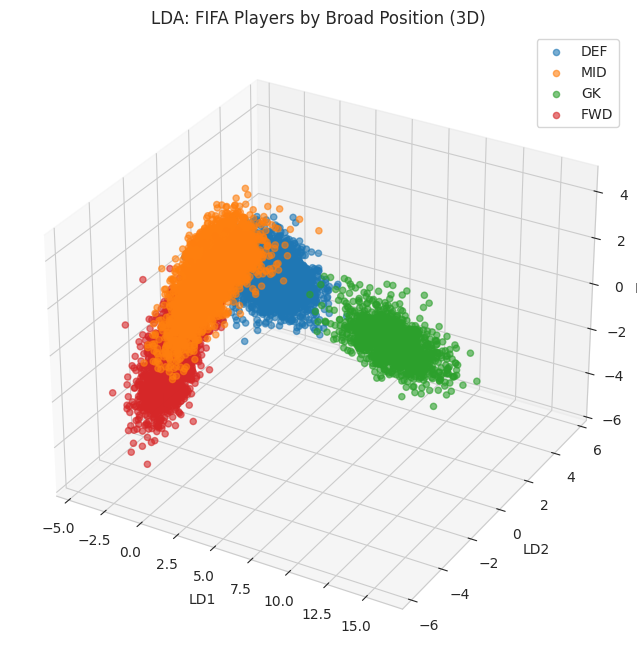

In [ ]:
# Create 3D plot
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection = '3d')

for cls in lda_train_df['broad_position'].unique():
    subset = lda_train_df[lda_train_df['broad_position'] == cls]
    ax.scatter(subset['LD1'],
               subset['LD2'],
               subset['LD3'],
               label = cls,
               alpha = 0.6)

ax.set_xlabel("LD1")
ax.set_ylabel("LD2")
ax.set_zlabel("LD3")
ax.set_title("LDA: FIFA Players by Broad Position (3D)")
ax.legend()

# Save
plt.savefig("images/lda_3d.png",
            dpi = 300,
            bbox_inches = 'tight')
plt.show()

What does this graphic mean? I don't know. We had a sub for this lesson, and it's still confusing for me...
This requires further research.

### Multinomial Logistic Regression After LDA

To classify player positions using multinomial logistic regression, we use the same pipeline that was used under PCA, except now dimensionality reduction is acomplished via LDA.

In [ ]:
# Define the pipeline
pipeline = Pipeline([('smote', SMOTE(sampling_strategy = 'minority', random_state = 42)),
 ('model', LogisticRegression(max_iter = 1000, random_state = 42))])

# Hyperparameter grid
p_grid = dict(model__C = [0.01, 0.1, 1, 5, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 150])

# 10-fold stratified CV
cv = StratifiedKFold(n_splits = 10, shuffle = True, random_state = 42)

# grid search
grid_search = GridSearchCV(estimator = pipeline,
                           param_grid = p_grid,
                           cv = cv,
                           scoring = 'accuracy',
                           n_jobs = -1)

grid_search.fit(X_train_lda, y_train)

# Best logistic regression model
best_logreg = grid_search.best_estimator_

# Best value of C found by CV
print("Best C value:", grid_search.best_params_['model__C'])

# Mean cross-validation accuracy for the best C
print("Best CV accuracy:", grid_search.best_score_)

Best C value: 1
Best CV accuracy: 0.8852208970442316


Based on the result above, the optimal `C` was found to be 1. This is a relatively small value, which forces the model to prioritize simplicity and prevent overfitting. This value for the regularization parameter achieves a mean CV accuracy of approximately 88.52%.

Note that among all the classifers we have explored using PCA for dimensinoality reduction, this achieves the a larger mean CV accuracy.

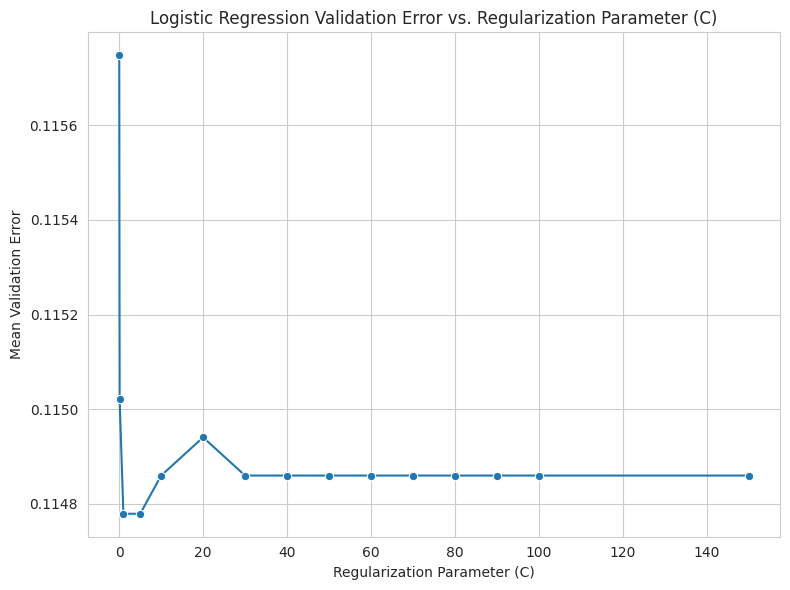

In [ ]:
# Extract CV results
cv_results = grid_search.cv_results_

C_values = cv_results['param_model__C'].data.astype(float)
mean_validation_accuracy = cv_results['mean_test_score']
mean_validation_error = 1 - mean_validation_accuracy

# Create dataframe
error_df = pd.DataFrame({'C': C_values, 'Validation Error': mean_validation_error}).sort_values(by = 'C')

# Plot
plt.figure(figsize=(8, 6))
sns.set_style("whitegrid")

sns.lineplot(data = error_df,
             x = 'C',
             y = 'Validation Error',
             marker = 'o')

plt.title("Logistic Regression Validation Error vs. Regularization Parameter (C)")
plt.xlabel("Regularization Parameter (C)")
plt.ylabel('Mean Validation Error')
plt.tight_layout()

# Save
plt.savefig("images/logreg_lda_error.png",
            dpi = 300,
            bbox_inches = 'tight')
plt.show()

We can now evaluate the classifier's performance on the test set.

In [ ]:
# Predict on test data
y_pred = best_logreg.predict(X_test_lda)

# Compute accuracy
test_accuracy = accuracy_score(y_test, y_pred)
print("Test Accuracy:", test_accuracy)

# Classification report
print("\nClassification Report:\n", classification_report(y_test, y_pred))

# Confusion matrix
conf_mat = confusion_matrix(y_test, y_pred, labels=['DEF', 'MID', 'FWD', 'GK'])
conf_mat_df = pd.DataFrame(conf_mat, index = ['DEF', 'MID', 'FWD', 'GK'], columns = ['DEF', 'MID', 'FWD', 'GK'])
print("\nConfusion Matrix:\n", conf_mat_df)

Test Accuracy: 0.8821092278719397

Classification Report:
               precision    recall  f1-score   support

         DEF       0.92      0.92      0.92      1740
         FWD       0.84      0.79      0.81       989
          GK       1.00      1.00      1.00       607
         MID       0.83      0.86      0.84      1974

    accuracy                           0.88      5310
   macro avg       0.90      0.89      0.90      5310
weighted avg       0.88      0.88      0.88      5310


Confusion Matrix:
       DEF   MID  FWD   GK
DEF  1602   138    0    0
MID   129  1691  154    0
FWD     3   202  784    0
GK      0     0    0  607


The model achieved an overall accuracy of approximately 88.21% on the test set.

Precision was highest for goalkeepers and defenders, with scores of 1.00 and 0.92, respectively. Forwards had a precision of 0.84 and midfielders had a precision of 0.83. This model demonstrates that even with a reduced feature space, we are able to capture meaningful distinctions between player roles.

Forwards and midfielders are more frequently confused with each other, as seen in the confusion matrix. In particular, 154 midfielders were misclassified as forwards, and 202 forwards as midfielders. This suggests that the features used for LDA retain enough information to distinguish broad roles, but midfield and forward positions have overlapping characteristics that make them harder to separate.

### k-Nearest Neighbors After LDA

In [ ]:
# Define pipeline
pipeline_knn = Pipeline([('smote', SMOTE(sampling_strategy = 'minority', random_state = 42)),
 ('model', KNeighborsClassifier(weights = 'distance', metric = 'euclidean'))])

# Hyperparameter grid
param_grid_knn = dict(model__n_neighbors = list(range(1, 51)))

# 10-fold stratified CV
cv = StratifiedKFold(n_splits = 10, shuffle = True, random_state = 42)

# Grid search
grid_search_knn = GridSearchCV(estimator = pipeline_knn,
                               param_grid = param_grid_knn,
                               cv = cv,
                               scoring = 'accuracy',
                               n_jobs = -1)

# fit on training data
grid_search_knn.fit(X_train_lda, y_train)

# Best model
best_knn = grid_search_knn.best_estimator_

# Best hyperparameters
print("Best k:", grid_search_knn.best_params_['model__n_neighbors'])
print("Best CV accuracy:", grid_search_knn.best_score_)

Best k: 50
Best CV accuracy: 0.8877235015470551


Using 10-fold stratified cross validation, the optimal number of neighbors was $k = 50$. This value of $k$ achieved a mean CV accuracy of approximately 88.77%.

The relatively large value of $k$ suggests that smoother decision boundaries improve generalization performance. This k-NN model (having used LDA for dimensionality reduction) provides a slightly better fit that the multinomial logistic regression model.

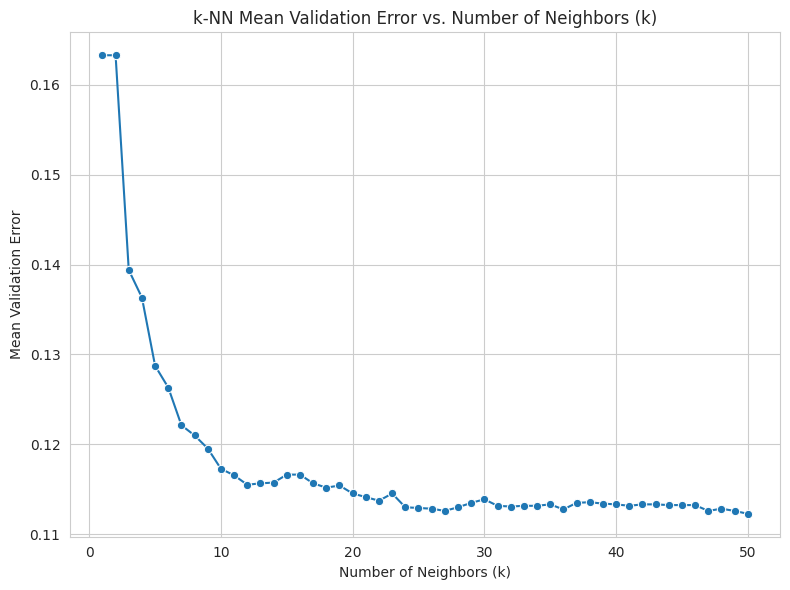

In [ ]:
# Extract CV results
cv_results = grid_search_knn.cv_results_

k_values = cv_results['param_model__n_neighbors'].data.astype(int)
mean_validation_accuracy = cv_results['mean_test_score']
mean_validation_error = 1 - mean_validation_accuracy

# Create dataframe
error_df = pd.DataFrame({'k': k_values,'Validation Error': mean_validation_error}).sort_values(by='k')

# Plot
plt.figure(figsize = (8, 6))

sns.set_style("whitegrid")

sns.lineplot(data=error_df,
             x='k',
             y='Validation Error',
             marker='o')

plt.title('k-NN Mean Validation Error vs. Number of Neighbors (k)')
plt.xlabel('Number of Neighbors (k)')
plt.ylabel('Mean Validation Error')
plt.tight_layout()

# Save
plt.savefig("images/knn_lda_error.png",
            dpi = 300,
            bbox_inches = 'tight')
plt.show()

We can now evaluate the classifier's performance on the test set.

In [ ]:
# Evaluate on test set
y_pred_knn = best_knn.predict(X_test_lda)

# Compute accuracy
test_accuracy = accuracy_score(y_test, y_pred_knn)
print("Test Accuracy:", test_accuracy)

# Classification report
print("\nClassification Report:\n", classification_report(y_test, y_pred_knn))

# Confusion matrix
conf_mat_knn = confusion_matrix(y_test, y_pred_knn, labels = ['DEF', 'MID', 'FWD', 'GK'])
conf_mat_knn_df = pd.DataFrame(conf_mat_knn, index = ['DEF', 'MID', 'FWD', 'GK'], columns = ['DEF', 'MID', 'FWD', 'GK'])
print("\nConfusion Matrix:\n", conf_mat_knn_df)

Test Accuracy: 0.8772128060263653

Classification Report:
               precision    recall  f1-score   support

         DEF       0.92      0.92      0.92      1740
         FWD       0.83      0.78      0.80       989
          GK       1.00      1.00      1.00       607
         MID       0.82      0.86      0.84      1974

    accuracy                           0.88      5310
   macro avg       0.89      0.89      0.89      5310
weighted avg       0.88      0.88      0.88      5310


Confusion Matrix:
       DEF   MID  FWD   GK
DEF  1593   147    0    0
MID   129  1690  155    0
FWD     1   220  768    0
GK      0     0    0  607


The distance weighted k-NN model achieved a test accuracy of 87.72%. This accuracy value suggests a strong overall generalization performance that is consistent with the cross validation results.

The model performs perfectly for goalkeepers, achieving 100% precision and recall. Defensive players are also classified reliably. The precision and recall scores for this class are both 0.92. Midfielders show slightly lower precision (0.82) but solid recall (0.86). This shows that most true midfielders are correctly identified, but a small number of non-midfielders are misclassified as midfielders. The weakest performance is observed for forwards, where recall drops to 0.78. This means approximately 22% of true forwards are misclassified, most commonly as midfielders.

The confusion matrix confirms that the primary source of error arises from overlap between midfielders and forwards, and to a lesser extent between defenders and midfielders. Overall, the model demonstrates decent classification across classes.

### Naïve Bayes After LDA

In [ ]:
# Define pipeline
pipeline_nb = Pipeline([('smote', SMOTE(sampling_strategy = 'minority', random_state = 42)),
 ('model', GaussianNB())])

# Hyperparameter grid
param_grid_nb = dict(model__var_smoothing = [1e-12, 1e-11, 1e-10, 1e-9, 1e-8, 1e-7, 1e-6, 1e-5, 1e-4, 1e-3])

# 10-fold stratified CV
cv = StratifiedKFold(n_splits = 10, shuffle = True, random_state = 42)

# grid search
grid_search_nb = GridSearchCV(estimator = pipeline_nb,
                              param_grid = param_grid_nb,
                              cv = cv,
                              scoring = 'accuracy',
                              n_jobs = -1)

# Fit on training data
grid_search_nb.fit(X_train_lda, y_train)

# Best model
best_nb = grid_search_nb.best_estimator_

# Best hyperparameter
print("Best var_smoothing:", grid_search_nb.best_params_['model__var_smoothing'])
print("Best CV accuracy:", grid_search_nb.best_score_)

Best var_smoothing: 1e-12
Best CV accuracy: 0.8831221045686697


Using 10-fold stratified cross validation, the optimal var_smoothing for the Gaussian Naïve Bayes classifier was found to be $1\times 10^{-12}$. This resulted in a mean CV accuracy of approximately 88.31%.

Overall, the model is able to reasonably distinguish between player positions, though its accuracy is slightly lower than that of logistic regression and K-NN on the same reduced feature space.

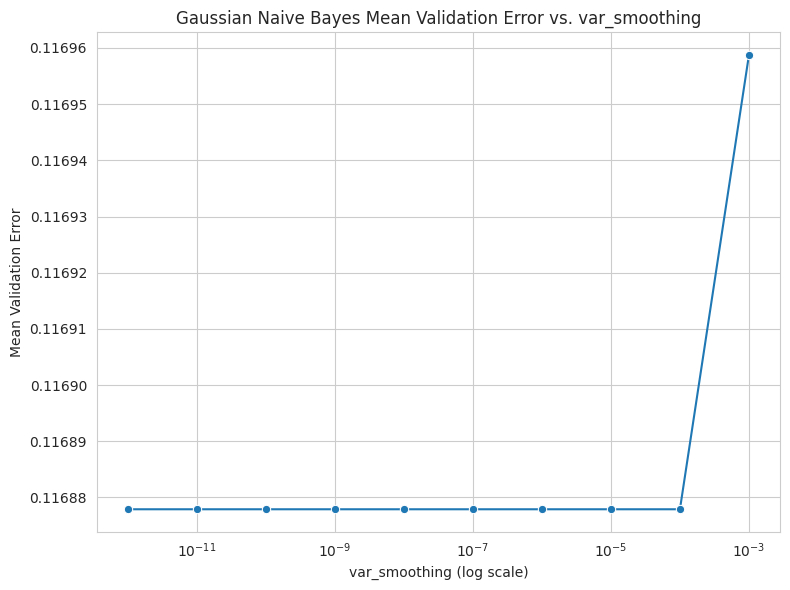

In [ ]:
# Extract CV results
cv_results = grid_search_nb.cv_results_

smoothing_values = cv_results['param_model__var_smoothing'].data
mean_validation_accuracy = cv_results['mean_test_score']
mean_validation_error = 1 - mean_validation_accuracy

# Create dataframe
error_df = pd.DataFrame({'var_smoothing': smoothing_values, 'Validation Error': mean_validation_error}).sort_values(by = 'var_smoothing')

# Plot
plt.figure(figsize=(8, 6))
sns.set_style("whitegrid")

sns.lineplot(data = error_df,
             x = 'var_smoothing',
             y = 'Validation Error',
             marker = 'o')

plt.xscale('log')
plt.title('Gaussian Naive Bayes Mean Validation Error vs. var_smoothing')
plt.xlabel('var_smoothing (log scale)')
plt.ylabel('Mean Validation Error')
plt.tight_layout()

# Save
plt.savefig("images/nb_lda_error.png",
            dpi = 300,
            bbox_inches = 'tight')
plt.show()

We can now evaluate the classifier's performance on the test set.



In [ ]:
# Evaluate on test set
y_pred_nb = best_nb.predict(X_test_lda)
test_accuracy_nb = accuracy_score(y_test, y_pred_nb)
print("Test Accuracy:", test_accuracy_nb)

# Classification report
print("\nClassification Report:\n", classification_report(y_test, y_pred_nb))

# Confusion matrix
conf_mat_nb = confusion_matrix(y_test, y_pred_nb, labels = ['DEF', 'MID', 'FWD', 'GK'])
conf_mat_df_nb = pd.DataFrame(conf_mat_nb, index = ['DEF', 'MID', 'FWD', 'GK'], columns = ['DEF', 'MID', 'FWD', 'GK'])
print("\nConfusion Matrix:\n", conf_mat_df_nb)

Test Accuracy: 0.8804143126177024

Classification Report:
               precision    recall  f1-score   support

         DEF       0.95      0.89      0.92      1740
         FWD       0.82      0.81      0.81       989
          GK       1.00      1.00      1.00       607
         MID       0.82      0.87      0.84      1974

    accuracy                           0.88      5310
   macro avg       0.90      0.89      0.89      5310
weighted avg       0.88      0.88      0.88      5310


Confusion Matrix:
       DEF   MID  FWD   GK
DEF  1553   187    0    0
MID    84  1718  172    0
FWD     2   190  797    0
GK      0     0    0  607


The model achieved an overall accuracy of approximately 88.04% on the test set.

The classifier performs exceptionally well for goalkeepers, achieving perfect precision and recall. The model also achieves very high precision for defenders (0.95) and forwards (0.82). Midfielders show slightly lower precision (0.82) but reasonable recall (0.87).

Overall, despite using a reduced feature space via LDA and the simplicity of the Naive Bayes assumptions, the model effectively distinguishes between the four broad positional classes.

# RQ2: Exploratory Data Analysis

Methods: Compare Logistic Regression using softmax (multinomial) multiclass classification and Random Forest using the gini impurity for decisions.

Import packages

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
import matplotlib.pyplot as plt
from imblearn.over_sampling import SMOTE
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline

### Data Preprocessing

Clone train set of cleaned data and update overall_rating feature to player_quality feature (gold=HIGH, silver=MID, bronze=LOW) using splits in the overall rating feature

In [ ]:
RQ2_fifa = fifa_clean.copy()
# Update the values based on ranges
# 0: <= 64
# 1: 65 - 74
# 2: >= 75
RQ2_fifa['overall_rating'] = pd.cut(
    RQ2_fifa['overall_rating'],
    bins=[-float('inf'), 64, 74, float('inf')],
    labels=['LOW', 'MID', 'HIGH']
)

# Rename column to 'player quality'
RQ2_fifa.rename(columns={'overall_rating': 'player_quality'}, inplace=True)

# Display the result
#print(RQ2_fifa.head())
# Define predictors & exclude $ vars like in RQ1 (prevent data leakage for RQ3)
X_RQ2 = RQ2_fifa.drop(columns = ['player_quality', 'value_euro', 'wage_euro'])
y_RQ2 = RQ2_fifa['player_quality']

# 70/30 split with stratification
X_train_RQ2, X_test_RQ2, y_train_RQ2, y_test_RQ2 = train_test_split(X_RQ2, y_RQ2,
                                                    test_size = 0.30,
                                                    random_state = 42,
                                                    stratify = y_RQ2)

print("Training set size:", X_train_RQ2.shape)
print("Test set size:", X_test_RQ2.shape)

Training set size: (12389, 39)
Test set size: (5310, 39)


Standardize and encode features

In [ ]:
# numeric features
numeric_features_RQ2 = ['age', 'height_cm', 'weight_kgs', 'potential',
    'international_reputation(1-5)', 'weak_foot(1-5)', 'skill_moves(1-5)',
    'crossing', 'finishing', 'heading_accuracy', 'short_passing', 'volleys',
    'dribbling', 'curve', 'freekick_accuracy', 'long_passing',
    'ball_control', 'acceleration', 'sprint_speed', 'agility', 'reactions',
    'balance', 'shot_power', 'jumping', 'stamina', 'strength', 'long_shots',
    'aggression', 'interceptions', 'positioning', 'vision', 'penalties',
    'composure', 'marking', 'standing_tackle', 'sliding_tackle']

# categorical features
categorical_features_RQ2 = ['preferred_foot', 'broad_position', 'body_type']

In [ ]:
# preprocessing pipeline
preprocessor_RQ2 = ColumnTransformer(
    transformers = [('num', StandardScaler(), numeric_features_RQ2),
     ('cat', OneHotEncoder(handle_unknown = 'ignore'), categorical_features_RQ2)])

# Fit on training data and transform
X_train_processed_RQ2 = preprocessor_RQ2.fit_transform(X_train_RQ2)

# Apply same transformations to test data
X_test_processed_RQ2 = preprocessor_RQ2.transform(X_test_RQ2)

print("Processed training set shape:", X_train_processed_RQ2.shape)
print("Processed test set shape:", X_test_processed_RQ2.shape)

Processed training set shape: (12389, 45)
Processed test set shape: (5310, 45)


Calclate VIF for each feature to check multicollinearity.

In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
X_train_processed_RQ2_df = pd.DataFrame(X_train_processed_RQ2)

vif_data = pd.DataFrame()
vif_data["feature"] = X_train_processed_RQ2_df.columns
vif_data["VIF"] = [variance_inflation_factor(X_train_processed_RQ2_df.values, i) for i in range(len(X_train_processed_RQ2_df.columns))]

print(vif_data.sort_values(by="VIF", ascending=False))

/usr/local/lib/python3.12/dist-packages/statsmodels/stats/outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)


    feature        VIF
41       41        inf
40       40        inf
39       39        inf
38       38        inf
36       36        inf
44       44        inf
43       43        inf
42       42        inf
37       37        inf
34       34  28.840121
35       35  23.986217
16       16  20.235033
12       12  17.051288
10       10  13.251094
28       28  12.002470
8         8  11.464403
29       29  10.025434
26       26   9.781677
17       17   9.558754
18       18   7.874444
15       15   7.863258
13       13   7.501701
33       33   7.296948
7         7   7.228086
22       22   7.028543
11       11   7.023193
9         9   6.948524
14       14   5.148934
19       19   4.985297
31       31   4.903579
30       30   4.579351
24       24   4.088136
6         6   4.043864
21       21   4.032639
27       27   3.944577
20       20   3.728142
32       32   3.727097
0         0   3.403501
3         3   3.356860
25       25   3.290617
2         2   2.841869
23       23   1.573139
1         1

VIFs > 10 signal high multicollinearity

# RQ2: Can player skill attributes accurately classify players into FIFA rating tiers, and which features are most influential across models?


First we check for class imbalance.

In [ ]:
class_counts = y_RQ2.value_counts()
print("Class Counts:\n")
print(class_counts)

Class Counts:

player_quality
MID     8657
LOW     7033
HIGH    2009
Name: count, dtype: int64


In [ ]:
# Check class proportions
class_proportions = y_RQ2.value_counts(normalize=True)
print("\nClass Proportions:\n")
print(class_proportions)


Class Proportions:

player_quality
MID     0.489124
LOW     0.397367
HIGH    0.113509
Name: proportion, dtype: float64


The HIGH class is clearly underrepresented. At only about 11%, it is less than one-quarter the size of MID and much smaller than LOW.

We use SMOTE in the pipeline to up-sample the minority class.

In [ ]:
from imblearn.pipeline import Pipeline

# Define pipeline: SMOTE + multinomial logistic regression
pipeline_rq2 = Pipeline([('smote', SMOTE(sampling_strategy = 'minority', random_state = 42)),
 ('model', LogisticRegression(max_iter = 1000, random_state = 42))])

# Hyperparameter grid for parameter C
param_grid_rq2 = {'model__C': [0.01, 0.1, 1, 5, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 150]}

# 10-fold stratified cross validation
cv_rq2 = StratifiedKFold(n_splits = 10, shuffle = True, random_state = 42)

# Grid search
grid_search_rq2 = GridSearchCV(estimator = pipeline_rq2,
                               param_grid = param_grid_rq2,
                               cv = cv_rq2,
                               scoring = 'accuracy',
                               n_jobs = -1)

# Fit on preprocessed training data
grid_search_rq2.fit(X_train_processed_RQ2, y_train_RQ2)

# Best model and hyperparameter
best_logreg_rq2 = grid_search_rq2.best_estimator_
print("Best C value:", grid_search_rq2.best_params_['model__C'])
print("Best CV accuracy:", grid_search_rq2.best_score_)

Best C value: 70
Best CV accuracy: 0.8798122671757019


Using 10-fold stratified cross validation, the optimal number of neighbors was $k = 70$. This value of $k$ achieved a mean CV accuracy of approximately 87.99%.

The relatively large value of $k$ suggests that smoother decision boundaries improve generalization performance.

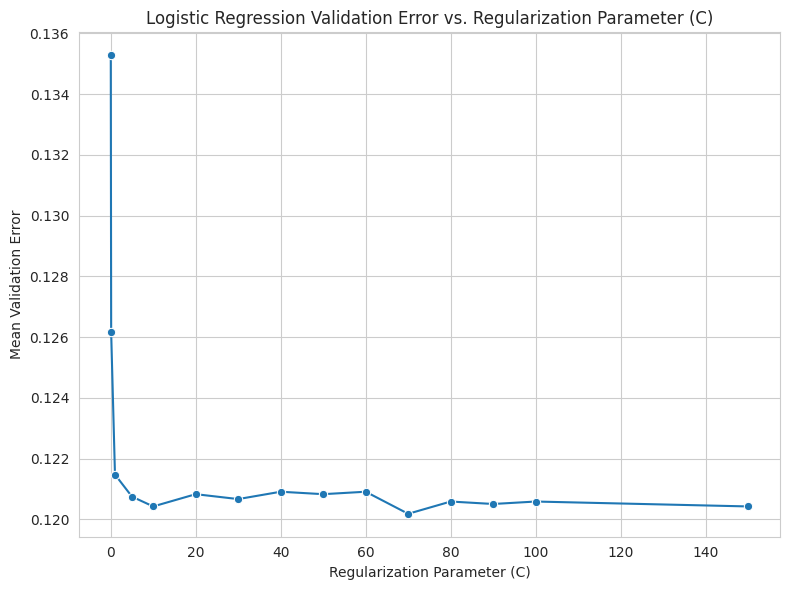

In [ ]:
# Extract CV results
cv_results = grid_search_rq2.cv_results_

C_values = cv_results['param_model__C'].data.astype(float)
mean_validation_accuracy = cv_results['mean_test_score']
mean_validation_error = 1 - mean_validation_accuracy

# Create dataframe
error_df = pd.DataFrame({'C': C_values, 'Validation Error': mean_validation_error}).sort_values(by = 'C')

# Plot
plt.figure(figsize = (8, 6))
sns.set_style("whitegrid")

sns.lineplot(data = error_df,
             x = 'C',
             y = 'Validation Error',
             marker = 'o')

plt.title("Logistic Regression Validation Error vs. Regularization Parameter (C)")
plt.xlabel("Regularization Parameter (C)")
plt.ylabel('Mean Validation Error')
plt.tight_layout()

# Save
plt.savefig("images/logreg_rq2.png",
            dpi = 300,
            bbox_inches = 'tight')
plt.show()

Now we can extract feature names after preprocesing.

In [ ]:
feature_names = preprocessor_RQ2.get_feature_names_out()
print(feature_names)

# Get coefficients from the 'model' step of the BEST estimator
coefficients = best_logreg_rq2.named_steps['model'].coef_
print(coefficients)

# Get class labels
classes = best_logreg_rq2.named_steps['model'].classes_
print(classes)

['num__age' 'num__height_cm' 'num__weight_kgs' 'num__potential'
 'num__international_reputation(1-5)' 'num__weak_foot(1-5)'
 'num__skill_moves(1-5)' 'num__crossing' 'num__finishing'
 'num__heading_accuracy' 'num__short_passing' 'num__volleys'
 'num__dribbling' 'num__curve' 'num__freekick_accuracy'
 'num__long_passing' 'num__ball_control' 'num__acceleration'
 'num__sprint_speed' 'num__agility' 'num__reactions' 'num__balance'
 'num__shot_power' 'num__jumping' 'num__stamina' 'num__strength'
 'num__long_shots' 'num__aggression' 'num__interceptions'
 'num__positioning' 'num__vision' 'num__penalties' 'num__composure'
 'num__marking' 'num__standing_tackle' 'num__sliding_tackle'
 'cat__preferred_foot_Left' 'cat__preferred_foot_Right'
 'cat__broad_position_DEF' 'cat__broad_position_FWD'
 'cat__broad_position_GK' 'cat__broad_position_MID' 'cat__body_type_Lean'
 'cat__body_type_Normal' 'cat__body_type_Stocky']
[[ 2.51738309e+00  4.47795518e-02  2.29664083e-01  4.60359255e+00
   8.94272417e-02 -7.

In [ ]:
coef_df = pd.DataFrame(coefficients.T,
                       index= feature_names,
                       columns = classes)

coef_df.head(10)

,HIGH,LOW,MID
num__age,2.517383,-2.492999,-0.024384
num__height_cm,0.044780,-0.040665,-0.004114
num__weight_kgs,0.229664,-0.198615,-0.031049
num__potential,4.603593,-3.803221,-0.800372
num__international_reputation(1-5),0.089427,0.082406,-0.171833
num__weak_foot(1-5),-0.079090,0.055701,0.023389
num__skill_moves(1-5),0.700945,-0.854975,0.154030
num__crossing,-0.086613,-0.020647,0.107260
num__finishing,0.276419,-0.188065,-0.088354
num__heading_accuracy,0.774341,-0.853335,0.078994


These values represent log-odds contribution.

We can now identify the most influential features for each class.

In [ ]:
for cls in classes:
    print("Top 10 features for class ", cls, "\n")
    top_features = coef_df[cls].abs().sort_values(ascending = False).head(10)
    print(top_features, "\n")

Top 10 features for class  HIGH 

cat__broad_position_GK       7.804752
num__potential               4.603593
cat__broad_position_FWD      3.960613
cat__broad_position_MID      3.485856
cat__broad_position_DEF      2.713799
num__age                     2.517383
num__reactions               2.071463
num__ball_control            1.413538
cat__preferred_foot_Left     1.260589
cat__preferred_foot_Right    1.094927
Name: HIGH, dtype: float64 

Top 10 features for class  LOW 

cat__broad_position_GK     8.119104
num__potential             3.803221
cat__broad_position_FWD    3.298560
cat__broad_position_MID    3.043312
num__age                   2.492999
cat__broad_position_DEF    2.187861
num__reactions             1.692022
num__ball_control          1.251846
num__skill_moves(1-5)      0.854975
num__heading_accuracy      0.853335
Name: LOW, dtype: float64 

Top 10 features for class  MID 

cat__preferred_foot_Left     1.009059
cat__preferred_foot_Right    0.935827
num__potential             

The multinomial logistic regression results indicate that player position is one of the most influential predictors of FIFA rating tier. In particular being the goalkeeper is the most important feature.

 In addition, potential, age, and reactions consistently rank among the strongest numerical predictors across classes. These findings suggest that rating tiers are primarily driven by structural characteristics (such as position) and high impact core attributes rather than by minor technical skills.

We can also use Random Forests to answer this part of the research question. We don't need to stick with multinomial logistic regression. Recall from class that Random Forests provide a built-in feature importance measure.

**NOTE:** The following code takes up to 10 mins to run.

In [ ]:
# Define pipeline with SMOTE
rf_pipeline = Pipeline([('smote', SMOTE(sampling_strategy = 'minority', random_state = 42)),
 ('model', RandomForestClassifier(random_state = 42, n_jobs = -1))])

# Hyperparameter grid
param_grid_rf = {'model__n_estimators': [100, 200],
                 'model__min_samples_split': [2, 5],
                 'model__min_samples_leaf': [1, 4]}

# Stratified 10-fold CV
cv = StratifiedKFold(n_splits = 10, shuffle = True, random_state = 42)

# Grid search
grid_search_rf = GridSearchCV(estimator = rf_pipeline,
                              param_grid = param_grid_rf,
                              cv = cv,
                              scoring = 'accuracy',
                              n_jobs = -1)

# Fit on training data
grid_search_rf.fit(X_train_processed_RQ2, y_train_RQ2)

# Best Random Forest model
best_rf = grid_search_rf.best_estimator_

# Evaluate on test set
y_pred_rf = best_rf.predict(X_test_processed_RQ2)

print("Best hyperparameters:", grid_search_rf.best_params_)
print("Best CV accuracy:", grid_search_rf.best_score_)
print("Test Accuracy:", accuracy_score(y_test_RQ2, y_pred_rf))
print("\nClassification Report:\n", classification_report(y_test_RQ2, y_pred_rf))
print("\nConfusion Matrix:\n", confusion_matrix(y_test_RQ2, y_pred_rf))

Best hyperparameters: {'model__min_samples_leaf': 1, 'model__min_samples_split': 5, 'model__n_estimators': 200}
Best CV accuracy: 0.9464038302815994
Test Accuracy: 0.9493408662900188

Classification Report:
               precision    recall  f1-score   support

        HIGH       0.92      0.96      0.94       603
         LOW       0.96      0.95      0.95      2110
         MID       0.95      0.95      0.95      2597

    accuracy                           0.95      5310
   macro avg       0.94      0.95      0.95      5310
weighted avg       0.95      0.95      0.95      5310


Confusion Matrix:
 [[ 576    1   26]
 [   0 1997  113]
 [  48   81 2468]]


The Random Forest model performs extremely well at classifying players into FIFA rating tiers. Using 10-fold stratified cross validation, the optimal hyperparameters were 200 trees (n_estimators), a minimum of 5 samples to split a node, and 1 sample per leaf. The model achieved a mean CV accuracy of 94.64% and a test accuracy of 94.93%. This is excellent generalization to unseen data.

Now that the model is trained, we can extract the feature importance scores.

In [ ]:
# Extract best RF model from grid search
best_rf = grid_search_rf.best_estimator_.named_steps['model']

# Get the number of features after preprocessing
n_features = X_train_processed_RQ2.shape[1]

# Get one-hot feature names from preprocessor
ohe = preprocessor_RQ2.named_transformers_['cat']
cat_features = ohe.get_feature_names_out(categorical_features_RQ2)

# Combine numeric and categorical
all_features = np.concatenate([numeric_features_RQ2, cat_features])

# Build DataFrame with feature importances
rf_importances = pd.DataFrame({
    'feature': all_features,
    'importance': best_rf.feature_importances_
}).sort_values(by='importance', ascending=False)

# Display top 10 features
print(rf_importances.head(10))

            feature  importance
3         potential    0.154953
20        reactions    0.141567
16     ball_control    0.077612
32        composure    0.070784
0               age    0.046043
34  standing_tackle    0.043311
28    interceptions    0.037000
10    short_passing    0.036855
12        dribbling    0.036407
29      positioning    0.031210
